In [1]:
# basic stuff 
from scipy import stats, signal, io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
# from google.colab import files
import os
import sklearn
import time
import json
import math
# import statsmodels.api as sm
from sklearn.metrics import r2_score

# torch stuff
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torch import nn
import torch.nn.functional as F

import joint_angles
import mat73

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import sys
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/PopFR/')
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/xds_python/')

from xds import lab_data
import joint_angles

# Data

In [19]:
mat_20210712_xds = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR/combined_opensim_neural/','20210712_Pop_FR_01.mat')
mat_20211108_xds = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR/combined_opensim_neural/','20211108_Pop_FR_001.mat')
mat_20211105_xds = lab_data('/content/drive/MyDrive/Miller_Lab/FIU/PopFR/combined_opensim_neural/','20211105_Pop_FR_001.mat')
xds_list = [mat_20210712_xds, mat_20211108_xds, mat_20211105_xds]

In [20]:
for xds_file in xds_list:
    print(xds_file.joint_angles.shape, xds_file.spike_counts.shape)

(35970, 24) (1199008, 142)
(17970, 24) (599008, 93)
(35941, 24) (1199008, 113)


In [15]:
def make_divisible_by_100(xds_file):
    num_instances = xds_file.spike_counts.shape[0]
    new_num_instances = num_instances-(num_instances%100)
    xds_file.spike_counts = xds_file.spike_counts[:new_num_instances-1]
    xds_file.time_frame = xds_file.time_frame[:new_num_instances-1]
    # return(xds_file)

In [11]:
# opening this file with xds does not work!
# mat_20220309_xds = lab_data('/content/','new_labels_proc.mat')
mat_20220309 = io.loadmat('new_labels_proc.mat')
input_20220309 = mat_20220309['data'][0][0][-4]
output_20220309 = mat_20220309['data'][0][0][-1]
output_frates_20220309 = output_20220309*30

In [ ]:
for data in xds_list
    print('Session Duration: {}, Num Neural Instances: {}'.format(data.get_meta()['duration'], data.spike_counts.shape))

Session Duration: 1200.0040000000001, Num Neural Instances: (1199008, 142)
Session Duration: 600.004, Num Neural Instances: (599008, 93)
Session Duration: 1200.0040000000001, Num Neural Instances: (1199008, 113)


In [8]:
mat_20210712_xds.joint_angles.shape

(35970, 24)

In [9]:
xds_file.spike_counts.shape

(1199008, 113)

In [24]:
# bin spike counts, convert to firing rates, and smooth with gaussian filter (stand. dev. = 2xbin_size)
xds_file = mat_20210712_xds #mat_20211108_xds, mat_20211105_xds
bin_size = 1/30
print('Shape before binning+smoothing is: {}'.format(xds_file.spike_counts.shape))
make_divisible_by_100(xds_file)

Shape before binning+smoothing is: (1199008, 142)


In [25]:
mat_20210712_xds.spike_counts.shape, xds_file.spike_counts.shape

((1198999, 142), (1198999, 142))

In [27]:
xds_file.update_bin_data(bin_size)                                      #bin
xds_file.spike_counts = xds_file.spike_counts/bin_size        #convert to firing rates
xds_file.smooth_binned_spikes(bin_size, 'gaussian', bin_size*2)         #smooth
print('Shape after binning+smoothing is: {}'.format(xds_file.spike_counts.shape))

The new bin size is 0.0333 s


IndexError: ignored

In [3]:
def normalize_joint_angles(arr):
    norm_arr = []
    for i in range(arr.shape[1]):
        col = arr[:,i]
        m = np.mean(col)
        var = np.var(col)
        norm = (col-m)/var
        norm_arr.append(norm)
    return(np.stack(norm_arr).T)

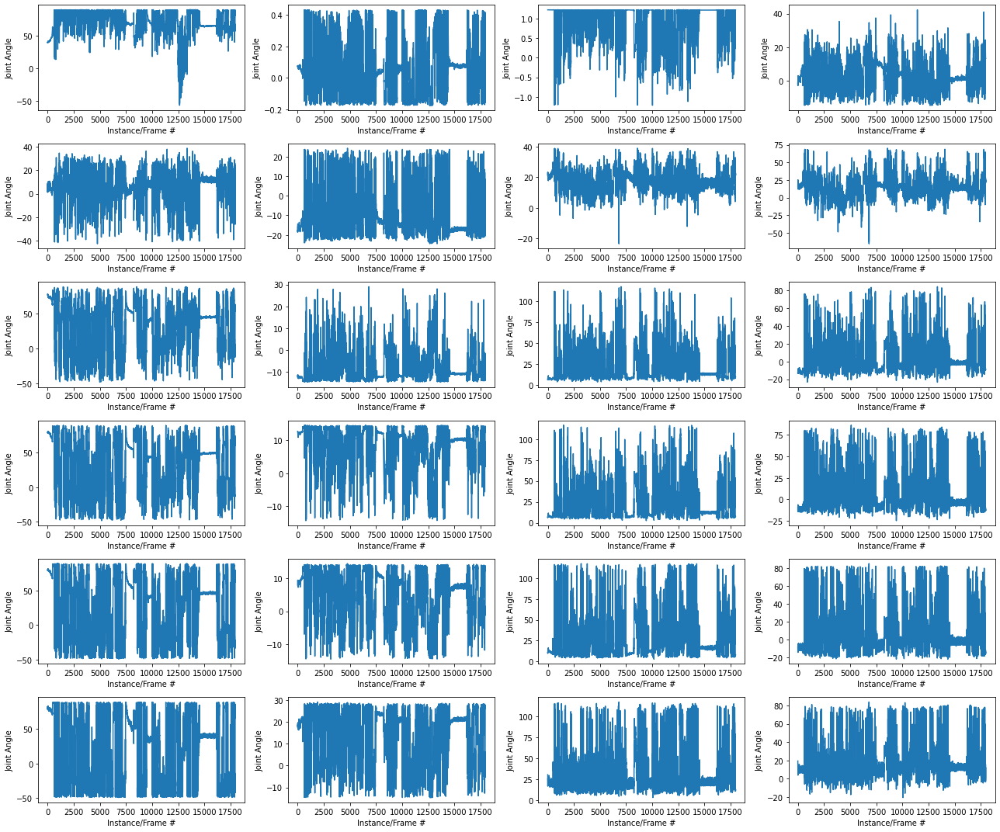

In [4]:
nrows, ncols = 6,4
f, ax = plt.subplots(nrows = nrows, ncols = ncols)
f.set_size_inches(18, 15)
for k in range(24):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(input_20220309[:,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Joint Angle')
# plt.suptitle('20220309 inputs')
plt.tight_layout()
plt.show()

In [5]:
# convert 2nd and 3rd electrodes to degrees
input_20220309[:,1]*=180/np.pi
input_20220309[:,2]*=180/np.pi

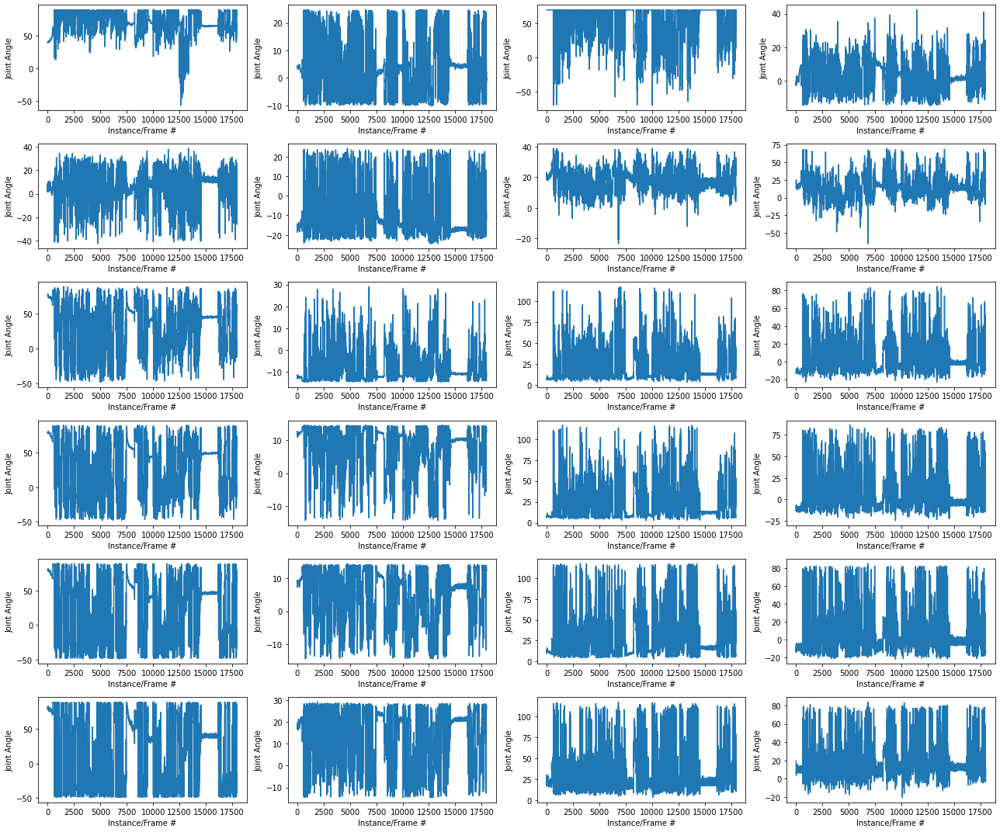

In [6]:
nrows, ncols = 6,4
f, ax = plt.subplots(nrows = nrows, ncols = ncols)
f.set_size_inches(18, 15)
for k in range(24):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(input_20220309[:,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Joint Angle')
# plt.suptitle('20220309 inputs')
plt.tight_layout()
plt.show()

In [7]:
#calculate velocities and normalize joint angles
velocities_20220309 = joint_angles.get_joint_velocities(input_20220309)
input_norm_20220309 = normalize_joint_angles(input_20220309)
angles_and_velocities_20220309 = np.hstack((input_20220309,velocities_20220309))

In [23]:
angles_and_velocities_20220309.shape

(17969, 48)

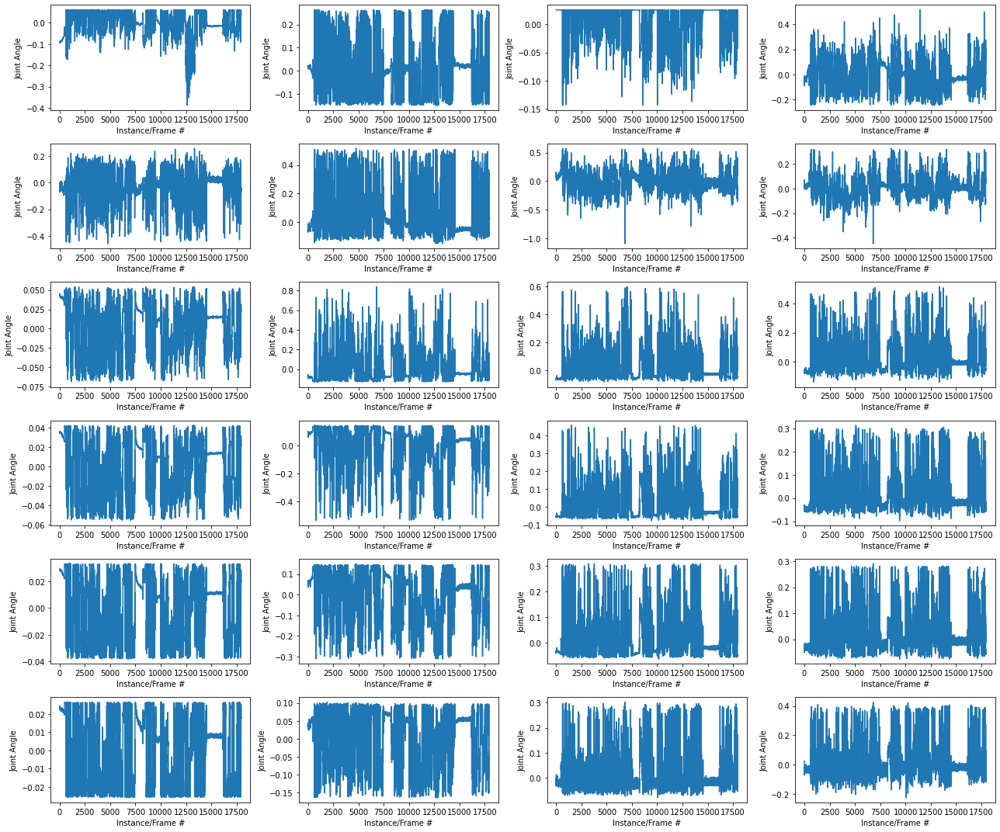

In [8]:
nrows, ncols = 6,4

f, ax = plt.subplots(nrows = nrows, ncols = ncols)
f.set_size_inches(18, 15)
for k in range(24):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(input_norm_20220309[:,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Joint Angle')
# plt.suptitle('20220309 inputs')
plt.tight_layout()
plt.show()

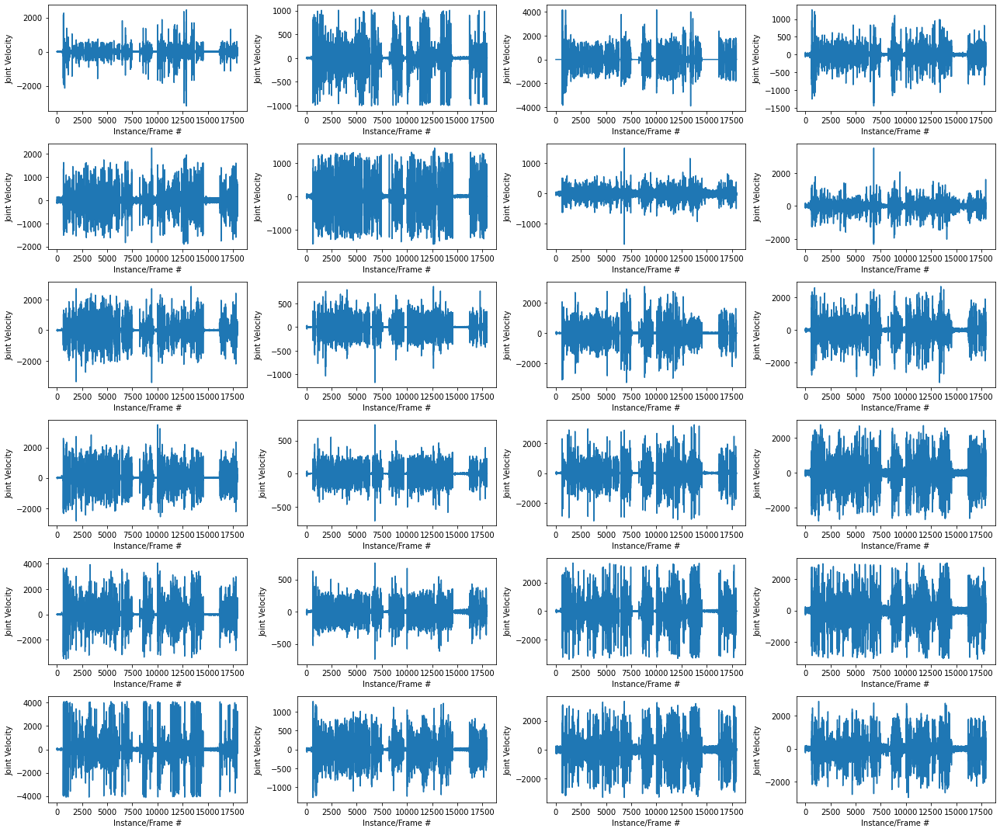

In [10]:
nrows, ncols = 6,4

f, ax = plt.subplots(nrows = nrows, ncols = ncols)
f.set_size_inches(18, 15)
for k in range(24):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(velocities_20220309[:,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Joint Velocity')
# plt.suptitle('20220309 inputs')
plt.tight_layout()
plt.show()

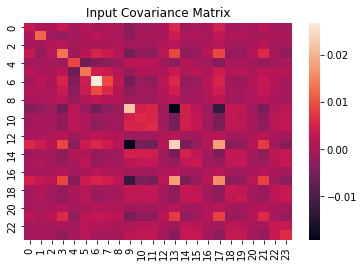

In [ ]:
import seaborn as sn
cov_matrix = np.cov(input_norm_20220309.T)
sn.heatmap(cov_matrix)
plt.title('Input Covariance Matrix')
plt.show()

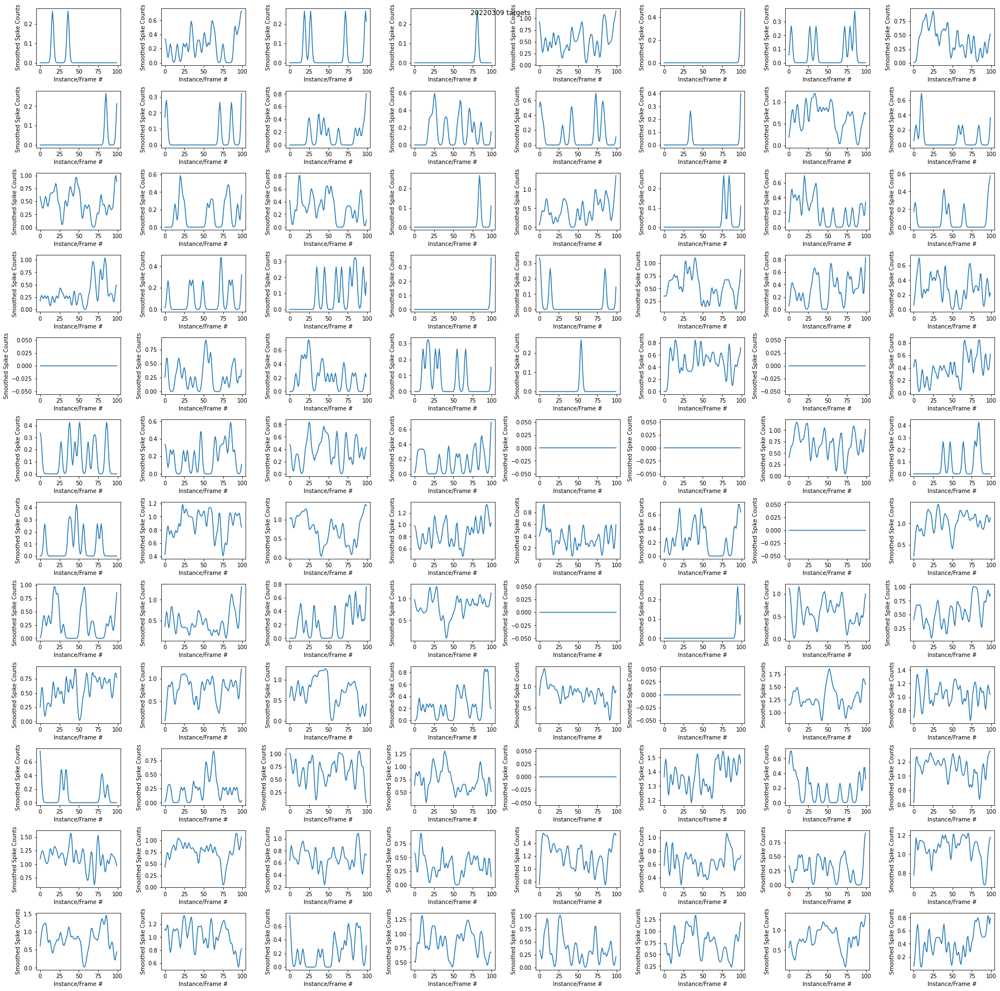

In [12]:
nrows,ncols=12,8
f, ax = plt.subplots(nrows, ncols)
f.subplots_adjust(top=0.97)
f.set_size_inches(25, 25)
for k in range(nrows*ncols):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(output_20220309[:100,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Smoothed Spike Counts')
    # if k==nrows*ncols-1:
    #     ax[j][i].plot(np.arange(100))
    # else:
    #     ax[j][i].plot(output_20220405[:100,k])
plt.suptitle('20220309 targets')
plt.tight_layout()
plt.show()

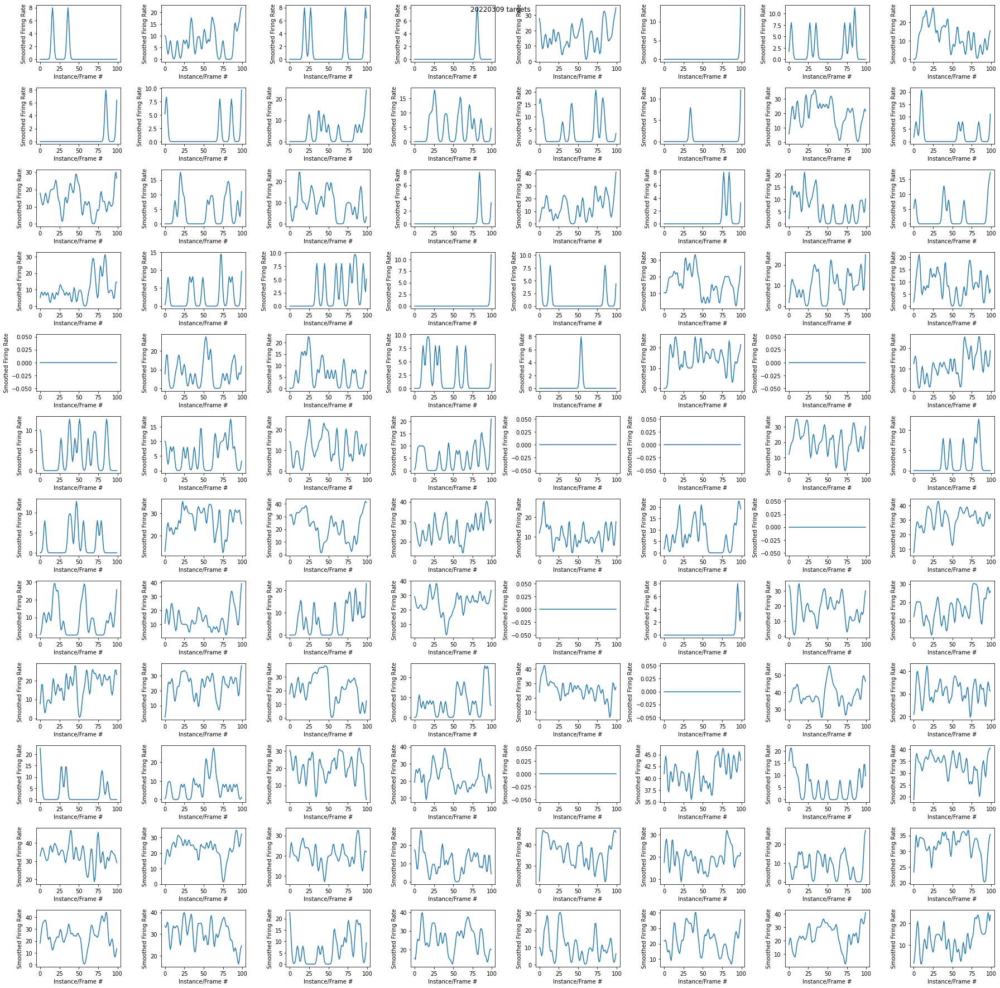

In [13]:
nrows,ncols=12,8
f, ax = plt.subplots(nrows, ncols)
f.subplots_adjust(top=0.97)
f.set_size_inches(25, 25)
for k in range(nrows*ncols):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(output_frates_20220309[:100,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Smoothed Firing Rate')
    # if k==nrows*ncols-1:
    #     ax[j][i].plot(np.arange(100))
    # else:
    #     ax[j][i].plot(output_20220405[:100,k])
plt.suptitle('20220309 targets')
plt.tight_layout()
plt.show()

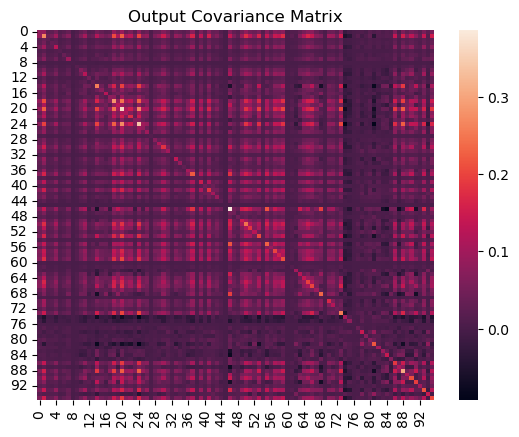

In [ ]:
import seaborn as sn
cov_matrix = np.cov(output_20220309.T)
sn.heatmap(cov_matrix)
plt.title('Output Covariance Matrix')
plt.show()

# Plotting "good" sections

In [14]:
good_input_20220309 = input_20220309[3000:3600]
good_input_norm_20220309 = input_norm_20220309[3000:3600]
good_output_20220309 = output_20220309[3000:3600]

In [15]:
good_input_norm_20220309.shape

(600, 24)

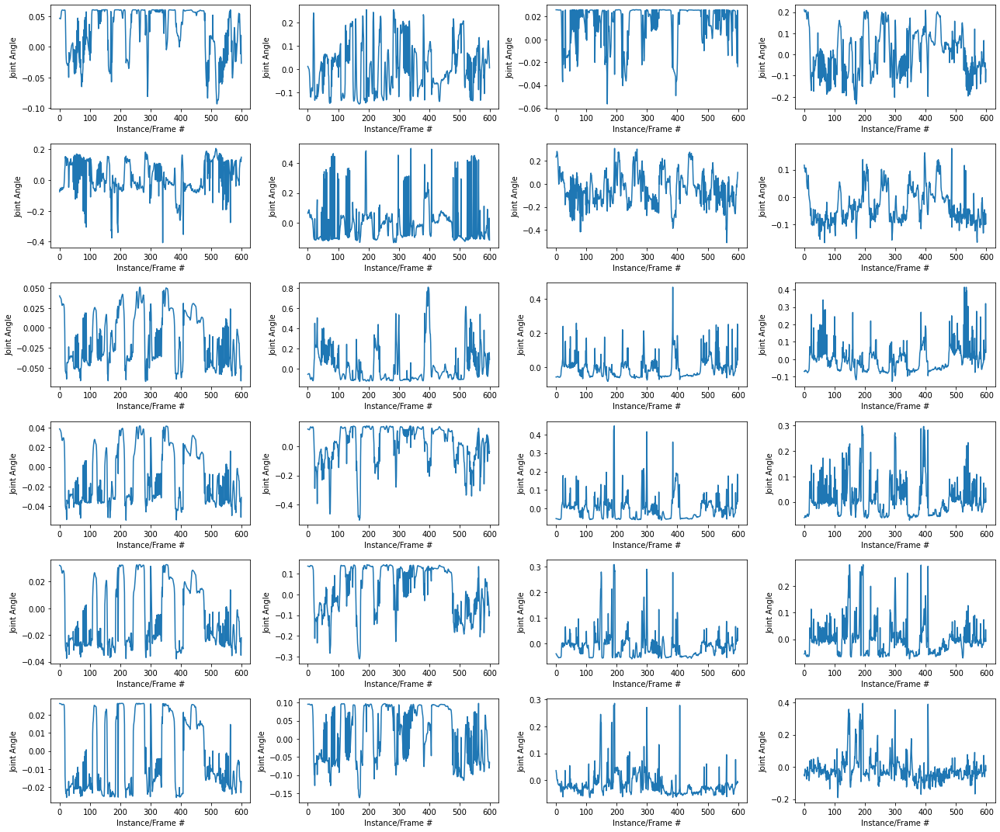

In [ ]:
nrows, ncols=  6,4
f, ax = plt.subplots(nrows = nrows, ncols = ncols)
f.set_size_inches(18, 15)
for k in range(24):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(good_input_norm_20220309[:,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Joint Angle')
plt.tight_layout()
plt.show()

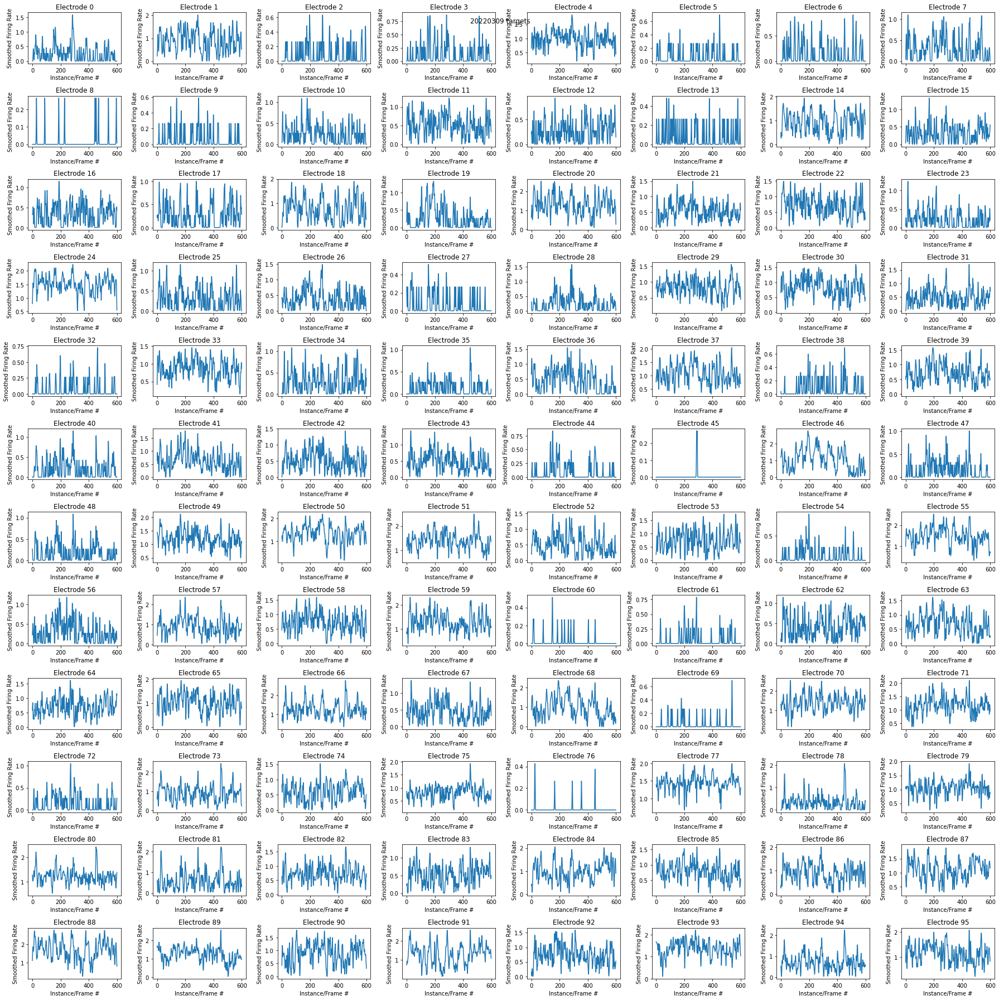

In [ ]:
nrows,ncols=12,8
f, ax = plt.subplots(nrows, ncols)
f.subplots_adjust(top=0.97)
f.set_size_inches(25, 25)
for k in range(nrows*ncols):
    i = k-(int(k/ncols)*ncols)
    j = int(k/ncols)
    ax[j][i].plot(good_output_20220309[:,k])
    ax[j][i].set_xlabel('Instance/Frame #')
    ax[j][i].set_ylabel('Smoothed Firing Rate')
    ax[j][i].set_title('Electrode {}'.format(k))
    # if k=ax[j][i]=nrows*ncols-1:
    #     ax[j][i].plot(np.arange(100))
    # else:
    #     ax[j][i].plot(output_20220405[:100,k])
plt.suptitle('20220309 targets')
plt.tight_layout()

# Sklearn Linear Regression

In [ ]:
# LinearRegression() works by using the Moore-Penrose pseudoinverse of X
from sklearn.linear_model import LinearRegression 
lin_reg = LinearRegression()
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(input_norm_20220309, output_20220309, test_size=0.2, shuffle = False, random_state=42)

lin_reg.fit(X_train, y_train)
pred_train = lin_reg.predict(X_train)
pred_test = lin_reg.predict(X_test)

In [ ]:
train_mse_linreg = np.mean(np.square(y_train-pred_train))
test_mse_linreg = np.mean(np.square(y_test-pred_test))

In [ ]:
train_mse_linreg, test_mse_linreg

(0.09877686656163322, 0.08564936205566907)

In [ ]:
train_r2 = r2_score(y_train,pred_train,multioutput='variance_weighted')
test_r2 = r2_score(y_test,pred_test,multioutput='variance_weighted')
print('Sklearn: Train r^2: {}, Test r^2: {}'.format(train_r2, test_r2))

Sklearn: Train r^2: 0.19678575748803742, Test r^2: 0.11910944555784582


# Sklearn Linear Regression Shuffled

In [ ]:
# LinearRegression() works by using the Moore-Penrose pseudoinverse of X 
lin_reg_shuff = LinearRegression()
X_train_shuff, X_test_shuff, y_train_shuff, y_test_shuff = train_test_split(input_norm_20220309, output_20220309, test_size=0.2, shuffle = True, random_state=42)

lin_reg_shuff.fit(X_train_shuff, y_train_shuff)
pred_train_shuff = lin_reg_shuff.predict(X_train_shuff)
pred_test_shuff = lin_reg_shuff.predict(X_test_shuff)

In [ ]:
train_mse_linreg_shuff = np.mean(np.square(y_train_shuff-pred_train_shuff))
test_mse_linreg_shuff = np.mean(np.square(y_test_shuff-pred_test_shuff))
print(train_mse_linreg_shuff, test_mse_linreg_shuff)

0.09494371831460989 0.0945535028788782


In [ ]:
train_r2_shuff = r2_score(y_train_shuff,pred_train_shuff, multioutput='variance_weighted')
test_r2_shuff = r2_score(y_test_shuff,pred_test_shuff, multioutput='variance_weighted')
print('Sklearn: Train r^2: {}, Test r^2: {}'.format(train_r2_shuff, test_r2_shuff))

Sklearn: Train r^2: 0.2232963570611441, Test r^2: 0.217435891481116


# Building Dataloader

In [16]:
input_norm_20220309.shape

(17969, 24)

In [17]:
class OSIMDataset(Dataset):
    def __init__(self, input, neuraldata, shuffle = False):
        # self.date = date
        self.inputs = input
        self.input_dim = self.inputs.shape[-1]
        self.num_neural_units = neuraldata.shape[-1]
        self.neuraloutputs = neuraldata
        self.sample_nums = np.arange(len(self.inputs))

        def shuffle_data(inputs, targets, samp_nums):
            assert len(inputs) == len(targets)
            p = np.random.permutation(len(inputs))
            return(inputs[p], targets[p], samp_nums[p])

        if shuffle == True:
            self.inputs, self.neuraloutputs, self.sample_nums = \
              shuffle_data(self.inputs, self.neuraloutputs, self.sample_nums)

    def __len__(self):
        assert len(self.inputs) == len(self.neuraloutputs)
        return len(self.inputs)

    def __getitem__(self, idx):
        input = torch.from_numpy(self.inputs[idx])
        neuraloutput = torch.from_numpy(self.neuraloutputs[idx])
        sample_num = self.sample_nums[idx]
        return input.float(), neuraloutput.float(), sample_num

In [18]:
def get_loaders(dataset):
    num_instances = len(dataset)
    train_split = int(num_instances*0.8)

    osim_train_dataset = Subset(dataset, np.arange(num_instances)[:train_split])
    osim_test_dataset = Subset(dataset, np.arange(num_instances)[train_split:])
    osim_toy_dataset = Subset(dataset, np.arange(num_instances)[:4])

    osim_train_loader = torch.utils.data.DataLoader(osim_train_dataset, batch_size=32, pin_memory=True, sampler=None)
    osim_test_loader = torch.utils.data.DataLoader(osim_test_dataset, batch_size=32, pin_memory=True)
    osim_toy_loader = torch.utils.data.DataLoader(osim_toy_dataset, batch_size=4, pin_memory=True)

    return(osim_train_loader, osim_test_loader, osim_toy_loader)

In [ ]:
# osim_dataset_20220405 = OSIMDataset(input_20220405, output_20220405[:,:24], shuffle = False)
# osim_dataset_20220405 = OSIMDataset(input_20220405, output_20220405, shuffle = False)
osim_dataset_20220309_norm = OSIMDataset(input_norm_20220309, output_20220309, shuffle = False)
osim_dataset_20220309_norm_shuff = OSIMDataset(input_norm_20220309, output_20220309, shuffle = True)
osim_dataset_20220309 = OSIMDataset(input_20220309, output_20220309, shuffle = False)
osim_dataset_20220309_shuff = OSIMDataset(input_20220309, output_20220309, shuffle = True)

osim_dataset_20220309_jointvel_shuff = OSIMDataset(velocities_20220309, output_20220309, shuffle = True)
osim_dataset_20220309_jointvel_shuff = OSIMDataset(velocities_20220309, output_20220309, shuffle = True)
# osim_dataset_20220309_shuff_shift = OSIMDataset(input_norm_20220309[], output_20220309, shuffle = True)

In [ ]:
input_norm_20220309.shape

(17969, 24)

#### Note - the plots below will be the same for unnormalized data. Also note that the overall shapes of any given instance is different because they're normalized differently (every column in the array has a different variance, therefore scaled differently)

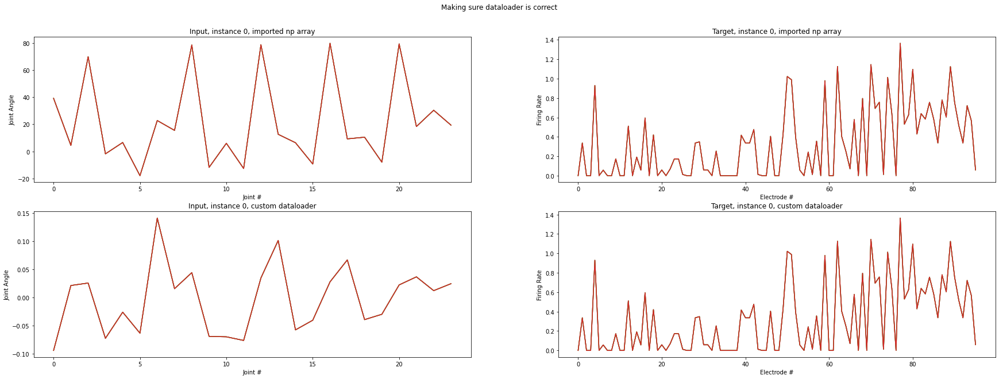

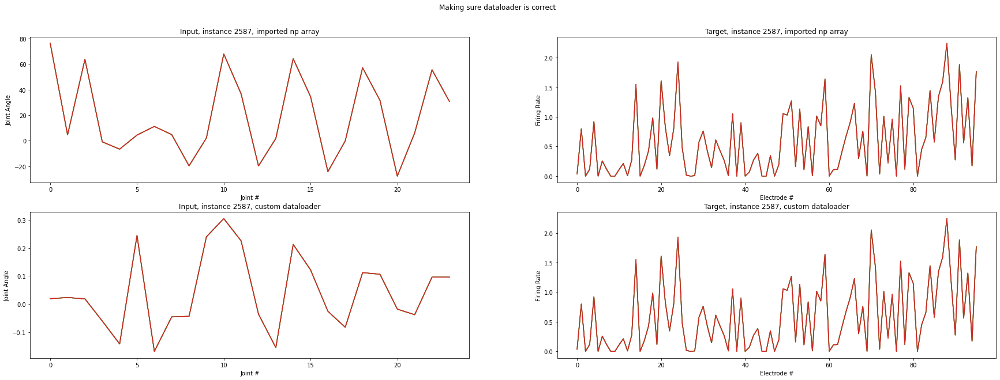

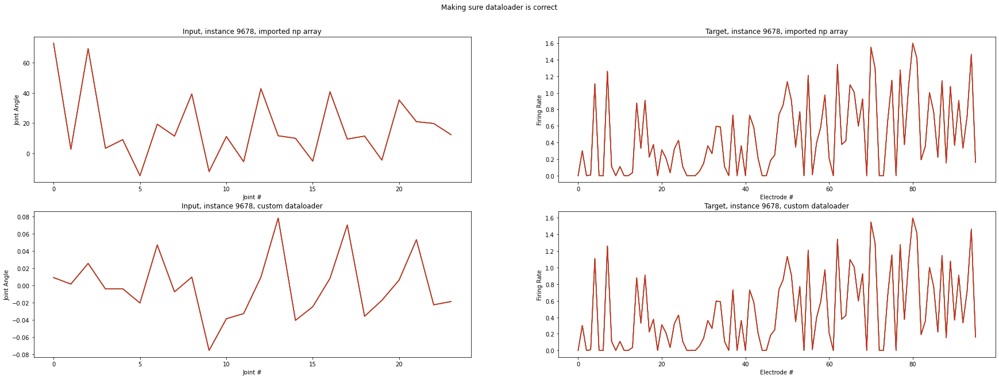

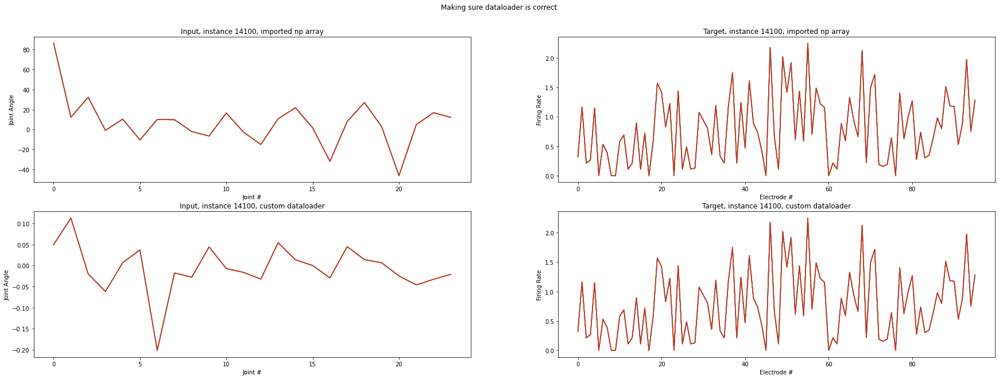

In [ ]:
instance_nums = [0,2587,9678,14100]
for instance_num in instance_nums:
    nrows,ncols=2,2
    f, ax = plt.subplots(nrows, ncols)
    f.subplots_adjust(top=0.9)
    f.set_size_inches(30, 10)
    # print('Row 1: input/output_20220405, Row 2: osim_dataset_20220405')
    f.suptitle('Making sure dataloader is correct')
    for k in range(nrows*ncols):
        ax[0][0].plot(input_20220309[instance_num])
        ax[0][0].set_title('Input, instance {}, imported np array'.format(instance_num))
        ax[0][0].set_xlabel('Joint #')
        ax[0][0].set_ylabel('Joint Angle')
        ax[0][1].plot(output_20220309[instance_num])
        ax[0][1].set_xlabel('Electrode #')
        ax[0][1].set_ylabel('Firing Rate')
        ax[0][1].set_title('Target, instance {}, imported np array'.format(instance_num))
        ax[1][0].plot(osim_dataset_20220309[instance_num][0])
        ax[1][0].set_title('Input, instance {}, custom dataloader'.format(instance_num))
        ax[1][0].set_xlabel('Joint #')
        ax[1][0].set_ylabel('Joint Angle')
        ax[1][1].plot(osim_dataset_20220309[instance_num][1])
        ax[1][1].set_xlabel('Electrode #')
        ax[1][1].set_ylabel('Firing Rate')
        ax[1][1].set_title('Target, instance {}, custom dataloader'.format(instance_num))
    # plt.tight_layout()
    plt.show()

# Model and Training

In [ ]:
class LinearModel(nn.Module):
    def __init__(self, input_size, output_size):
        super(LinearModel, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)
        self.num_layers = 1
        self.name = 'Linear Model'

    def forward(self, x):
        x = self.fc1(x)
        return x

In [ ]:
class FCNet(torch.nn.Module):
    def __init__(self, input_dim, output_dim, num_layers, hidden_layer_dim, add_relu = False):
        super(FCNet, self).__init__()
        self.name = 'Multi-Layer Perceptron'
        self.net = nn.ModuleList()
        assert num_layers >= 2
        self.num_layers = num_layers
        self.hidden_layer_dim = hidden_layer_dim

        if type(hidden_layer_dim == int):
            # input layer
            self.net.append(nn.Linear(input_dim, hidden_layer_dim))
            self.net.append(nn.ReLU())
            # hidden layers
            for i in range(num_layers-2):
                self.net.append(nn.Linear(hidden_layer_dim, hidden_layer_dim))
                self.net.append(nn.ReLU())
            # output layer
            self.net.append(nn.Linear(hidden_layer_dim, output_dim))
            if add_relu == True:
                self.net.append(nn.ReLU())
        
        elif type(hidden_layer_dim == list):
            assert len(hidden_layer_dim) == num_layers-1

            self.net.append(nn.Linear(input_dim, hidden_layer_dim[0]))
            self.net.append(nn.ReLU())
            for i in range(len(hidden_layer_dim)-1):
                self.net.append(nn.Linear(hidden_layer_dim[i], hidden_layer_dim[i+1]))
                self.net.append(nn.ReLU())
            self.net.append(nn.Linear(hidden_layer_dim[-1], output_dim))
    
    def forward(self, x):
        for layer in self.net:
            x = layer(x)
        return(x)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def train(loader, model, optimizer, criterion, scheduler, conv = False):
    model.train()
    batch_losses = []

    for i, (input, target, sample_num) in enumerate(loader):
        optimizer.zero_grad() #clear gradient
        input = input.to(device, dtype=torch.float)
        target = target.to(device, dtype=torch.float)
        
        pred = model(input)
        loss = criterion(pred, target)  # calculate loss
        mean_batch_loss = loss.item()
        batch_losses.append(mean_batch_loss)

        loss.backward()  # one backward pass
        # scheduler.step(loss)
        optimizer.step()  # update the parameters

    avg_loss_epoch = sum(batch_losses)/len(batch_losses)
    return(avg_loss_epoch)

def test(loader, model, optimizer, criterion, conv = False):
    model.eval()
    batch_losses = []
    pred_tot = []
    output_tot = []

    with torch.no_grad():
        for i, (input, target, sample_num) in enumerate(loader):
            input = input.to(device, dtype=torch.float)
            target = target.to(device, dtype=torch.float)
            pred = model(input)

            loss = criterion(pred, target)  
            mean_batch_loss = loss.item()
            batch_losses.append(mean_batch_loss)
            
            pred_tot += pred
            output_tot += target

    avg_loss_epoch = sum(batch_losses)/len(batch_losses)
    pred_tot = torch.stack(pred_tot).detach().numpy()
    output_tot = torch.stack(output_tot).detach().numpy()
    if conv == True:
        pred_tot = pred_tot.reshape(-1,96)
        output_tot = output_tot.reshape(-1,96)
    r2_tot_batch = r2_score(output_tot, pred_tot, multioutput='variance_weighted')
    
    return(avg_loss_epoch, r2_tot_batch, pred_tot, output_tot)

# def get_instance_losses(loader, model, criterion = torch.nn.MSELoss(reduction='none')):
#     model.eval()
#     inputs = []
#     targets = []
#     preds = []
#     sample_nums = []
#     losses = []

#     with torch.no_grad():
#         for i, (input, target, sample_num) in enumerate(loader):
#             input = input.to(device, dtype=torch.float)
#             target = target.to(device, dtype=torch.float)

#             pred = model(input)
#             all_losses_batch = criterion(pred, target)  # calculate loss
#             all_losses_batch = all_losses_batch.detach().cpu().data.numpy()
            
#             inputs.append(input.cpu().data.numpy())
#             targets.append(target.cpu().data.numpy())
#             sample_nums.append(sample_num)
#             preds.append(pred)
#             losses.append(all_losses_batch)

#     all_inputs = np.vstack(inputs)
#     all_targets = np.vstack(targets)
#     all_preds = np.vstack(preds)
#     all_sample_nums = np.hstack(sample_nums)
#     all_losses = np.vstack(losses)
#     all_losses = np.mean(all_losses, axis = 1)

#     all_data = [all_losses, all_inputs, all_targets, all_preds, all_sample_nums]
#     return(all_data)

def get_pr2_osim2(real_data, predictions, lam = 0, EPS = 0.000001):
    predictions[predictions==0]=EPS
    m = np.mean(real_data, axis = 0) #average for each neuron across all instances
    m[m==0]=EPS

    d1 = real_data/predictions #element-wise division
    d2 = real_data/m
    d1[d1==0]=EPS
    d2[d2==0]=EPS

    a1=(real_data*np.log(d1))-(real_data-predictions)
    a2=(real_data*np.log(d2))-(real_data-m)
    sum1 = np.sum(a1, axis = 0) #sum across instances
    sum2 = np.sum(a2, axis = 0) #sum across instances

    sum2[sum2==0]=EPS
    pR2 = 1 - (sum1/sum2)
    return(pR2)
    
def get_pr2_osim(real_data, predictions, lam = 0, EPS = 0.000001):
    print(real_data.shape, predictions.shape)
    pr2_list = []
    for i in range(real_data.shape[1]):
        real = real_data[:,i]
        pred = predictions[:,i]
        pred[pred==0]=EPS
        m = np.mean(real)
        if m == 0:
            m+=EPS

        d1 = np.divide(real,pred) #element-wise division; real and pred must be same sign for log to be valid
        d2 = real/m
        d1[d1==0]=EPS
        d2[d2==0]=EPS

        a1=np.multiply(real, np.log(d1))-(real-pred) #real and pred must be same sign for log to be valid
        a2=np.multiply(real, np.log(d2))-(real-m)
        sum1 = np.sum(a1) #sum across instances
        sum2 = np.sum(a2) #sum across instances

        if sum2==0:
            sum2+=EPS
        pR2 = 1 - (sum1/sum2)
        pr2_list.append(pR2)
    return(pr2_list)

# Linear Models

In [ ]:
def plot_losses(shuff, learning_rate, numepochs = 301):
    all_train_losses = []
    all_test_losses = []

    date = '20220309'
    assert ((shuff == 'Shuffled') or (shuff == 'Not Shuffled'))
    if shuff == 'Shuffled':
        train_loader, test_loader, toy_loader = get_loaders(osim_dataset_20220309_shuff)
        train_mse_linreg_plot, test_mse_linreg_plot = train_mse_linreg_shuff, test_mse_linreg_shuff
        output_size = 96
    elif shuff == 'Not Shuffled':
        train_loader, test_loader, toy_loader = get_loaders(osim_dataset_20220309)
        train_mse_linreg_plot, test_mse_linreg_plot = train_mse_linreg, test_mse_linreg
        output_size = 96
    model = LinearModel(input_size=24, output_size=output_size)

    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.8, patience=5, min_lr=0.00005)
    total_params = sum(p.numel() for p in model.parameters())

    print('{}, full dataset, {}'.format(model.name, shuff))

    train_losses = []
    val_losses = []
    test_losses = []
    start = time.time()
    for epoch in range(numepochs):
        lr = scheduler.optimizer.param_groups[0]['lr']
        train_loss = train(train_loader, model, optimizer, criterion, scheduler)
        _, train_R2, train_preds, train_targets = test(train_loader, model, optimizer, criterion)
        test_loss, test_R2, test_preds, test_targets = test(test_loader, model, optimizer, criterion)
        # scheduler.step(test_loss)
        if epoch % 50==0:
            print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:7f}, Test Loss: {:7f}. Train R2: {:.7f}, Test R2: {:.7f}'\
                  .format(epoch, lr, train_loss, test_loss, train_R2, test_R2))
        train_losses.append(train_loss)
        test_losses.append(test_loss)

    all_train_losses.append(train_losses)
    all_test_losses.append(test_losses)
    end = time.time()
    print('Time to train model: {}'.format(end-start))

    nrows,ncols=1,2
    f, ax = plt.subplots(nrows, ncols)
    f.set_size_inches(16, 4.8)
    ax[0].plot(np.log(train_losses))
    ax[0].plot([np.log(train_mse_linreg_plot)]*len(train_losses))
    ax[0].set_title('Train Log Losses - Date: {}, Model: {}, LR: {}'.format(date, model.name, learning_rate))
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Log Loss')
    ax[0].legend(['Train Log Loss', 'LinReg Train Log Loss'])
    ax[1].plot(np.log(test_losses))
    ax[1].plot([np.log(test_mse_linreg_plot)]*len(test_losses))
    ax[1].set_title('Test Log Losses - Date: {}, Model: {}, LR: {}'.format(date, model.name, learning_rate))
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Log Loss')
    ax[1].legend(['Test Log Loss', 'LinReg Test Log Loss'])
    plt.show()
    return(model)

Linear Model, full dataset, Shuffled
Epoch: 000, LR: 0.010000, Train Loss: 0.155702, Test Loss: 0.097952. Train R2: 0.1838260, Test R2: 0.1863495
Epoch: 050, LR: 0.010000, Train Loss: 0.096131, Test Loss: 0.094762. Train R2: 0.2127970, Test R2: 0.2127759
Epoch: 100, LR: 0.010000, Train Loss: 0.096078, Test Loss: 0.094723. Train R2: 0.2131913, Test R2: 0.2130883
Epoch: 150, LR: 0.010000, Train Loss: 0.096063, Test Loss: 0.094712. Train R2: 0.2132957, Test R2: 0.2131667
Epoch: 200, LR: 0.010000, Train Loss: 0.096058, Test Loss: 0.094709. Train R2: 0.2133302, Test R2: 0.2131889
Epoch: 250, LR: 0.010000, Train Loss: 0.096055, Test Loss: 0.094708. Train R2: 0.2133448, Test R2: 0.2131957
Epoch: 300, LR: 0.010000, Train Loss: 0.096054, Test Loss: 0.094708. Train R2: 0.2133526, Test R2: 0.2131979
Time to train model: 469.07453417778015


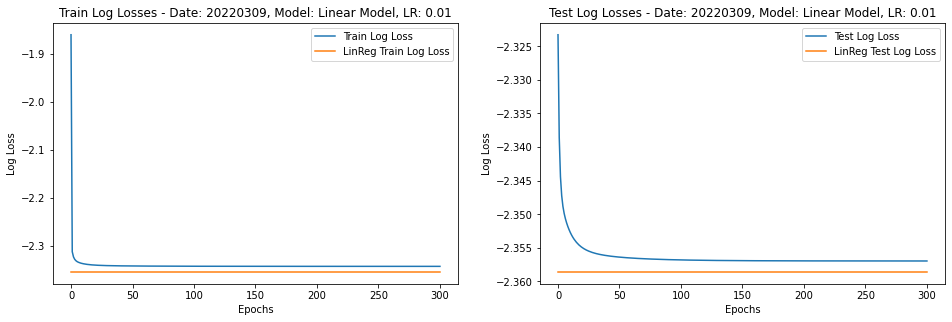

Linear Model, full dataset, Shuffled
Epoch: 000, LR: 0.001000, Train Loss: 0.439727, Test Loss: 0.291546. Train R2: -1.4017971, Test R2: -1.4219615
Epoch: 050, LR: 0.001000, Train Loss: 0.096254, Test Loss: 0.094521. Train R2: 0.2137814, Test R2: 0.2148561
Epoch: 100, LR: 0.001000, Train Loss: 0.095786, Test Loss: 0.094111. Train R2: 0.2175417, Test R2: 0.2182592
Epoch: 150, LR: 0.001000, Train Loss: 0.095599, Test Loss: 0.093941. Train R2: 0.2190490, Test R2: 0.2196606
Epoch: 200, LR: 0.001000, Train Loss: 0.095501, Test Loss: 0.093852. Train R2: 0.2198408, Test R2: 0.2203957
Epoch: 250, LR: 0.001000, Train Loss: 0.095443, Test Loss: 0.093800. Train R2: 0.2203080, Test R2: 0.2208220
Epoch: 300, LR: 0.001000, Train Loss: 0.095406, Test Loss: 0.093767. Train R2: 0.2206075, Test R2: 0.2210885
Time to train model: 468.3512682914734


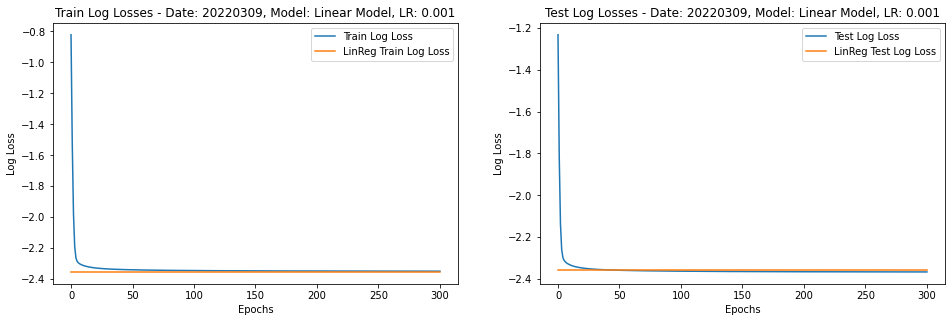

Linear Model, full dataset, Shuffled
Epoch: 000, LR: 0.000100, Train Loss: 0.583729, Test Loss: 0.555152. Train R2: -3.5655872, Test R2: -3.6107037
Epoch: 050, LR: 0.000100, Train Loss: 0.100796, Test Loss: 0.098845. Train R2: 0.1764331, Test R2: 0.1790218
Epoch: 100, LR: 0.000100, Train Loss: 0.098634, Test Loss: 0.096747. Train R2: 0.1938971, Test R2: 0.1963607
Epoch: 150, LR: 0.000100, Train Loss: 0.097743, Test Loss: 0.095906. Train R2: 0.2011340, Test R2: 0.2033412
Epoch: 200, LR: 0.000100, Train Loss: 0.097223, Test Loss: 0.095426. Train R2: 0.2053714, Test R2: 0.2073307
Epoch: 250, LR: 0.000100, Train Loss: 0.096883, Test Loss: 0.095119. Train R2: 0.2081356, Test R2: 0.2098866
Epoch: 300, LR: 0.000100, Train Loss: 0.096645, Test Loss: 0.094907. Train R2: 0.2100709, Test R2: 0.2116511
Time to train model: 464.26217460632324


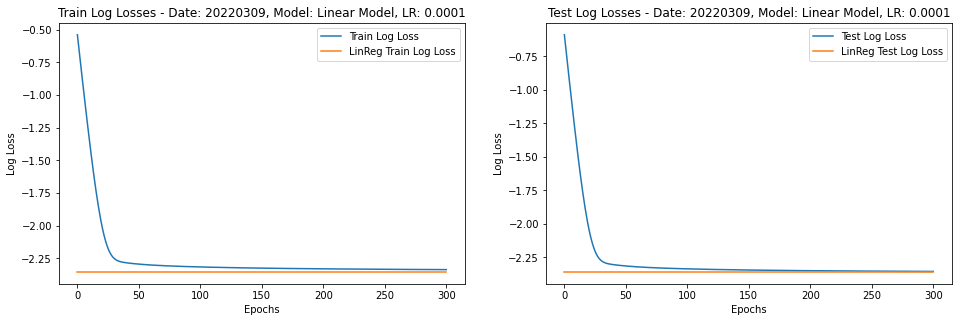

In [ ]:
# Sklearn: Train r^2: 0.2232963570611441, Test r^2: 0.217435891481116
linear_models_shuffled = []
for learning_rate in [0.01,0.001,0.0001]:
    lin_model = plot_losses(shuff='Shuffled', learning_rate=learning_rate)
    linear_models_shuffled.append(lin_model)

In [ ]:
def plot_targets_and_preds(targets, preds, rng, electrodes_list, fig_shape):
    nrows,ncols=fig_shape[0], fig_shape[1]
    assert len(electrodes_list) == nrows*ncols
    f, ax = plt.subplots(nrows, ncols)
    f.subplots_adjust(top=1.2)
    f.set_size_inches(40, 20)
    t = nrows*ncols
    for k in range(len(electrodes_list)):
        ax[k].plot(targets[:rng,electrodes_list[k]])
        ax[k].plot(preds[:rng,electrodes_list[k]])
        ax[k].set_xlabel('Frame/Instance #')
        ax[k].set_ylabel('Smoothed Binned Spike Counts')
        ax[k].set_title('Electrode {}'.format(electrodes_list[k]))
    # for k in range(len(electrodes_list)):
    #     i = k-(int(k/ncols)*ncols)
    #     j = int(k/ncols)
    #     ax[j][i].plot(targets[:rng,electrodes_list[k]])
    #     ax[j][i].plot(preds[:rng,electrodes_list[k]])
    #     ax[j][i].set_xlabel('Frame/Instance #')
    #     ax[j][i].set_ylabel('Smoothed Binned Spike Counts')
    #     ax[j][i].set_title('Electrode {}'.format(electrodes_list[k]))
    plt.show()

In [ ]:
len(linear_models_shuffled)

3

Learning Rate: 0.1


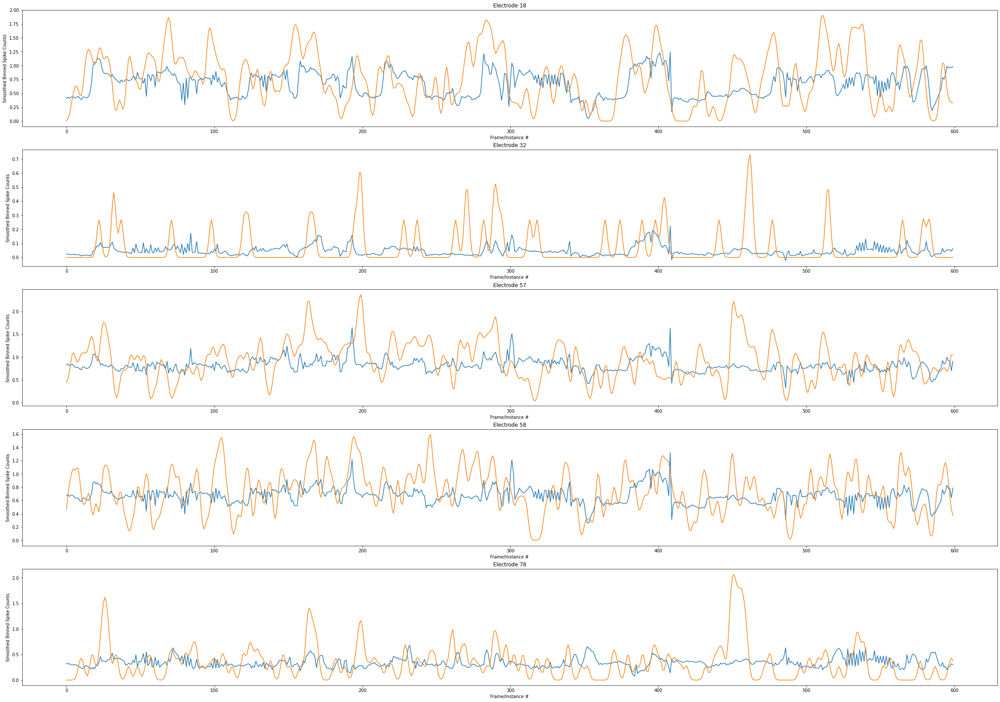

Learning Rate: 0.001


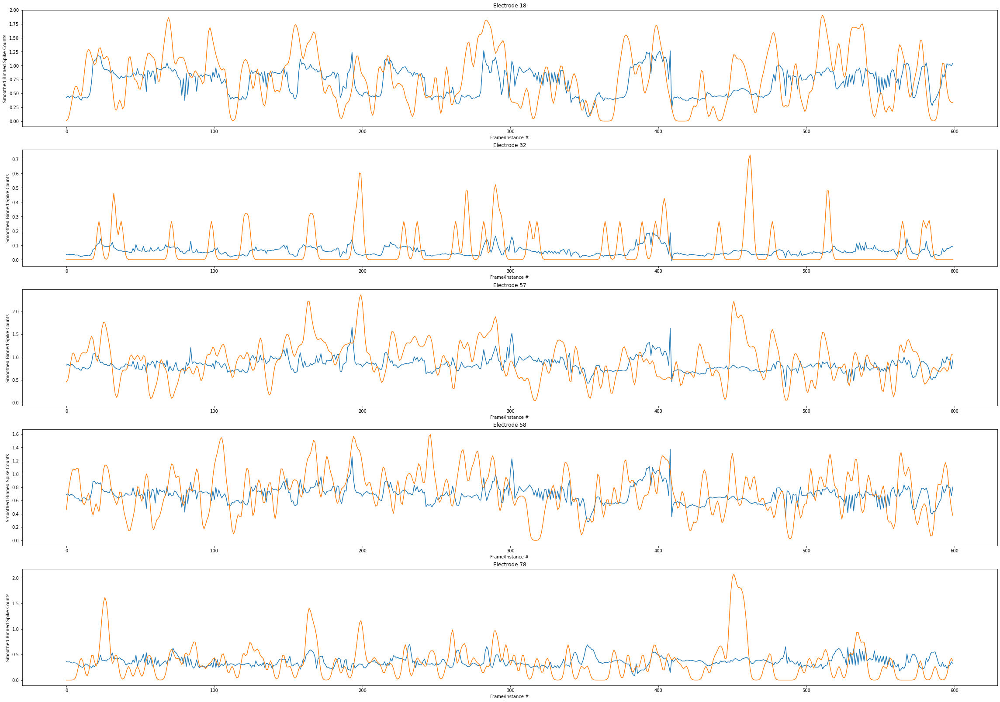

Learning Rate: 0.0001


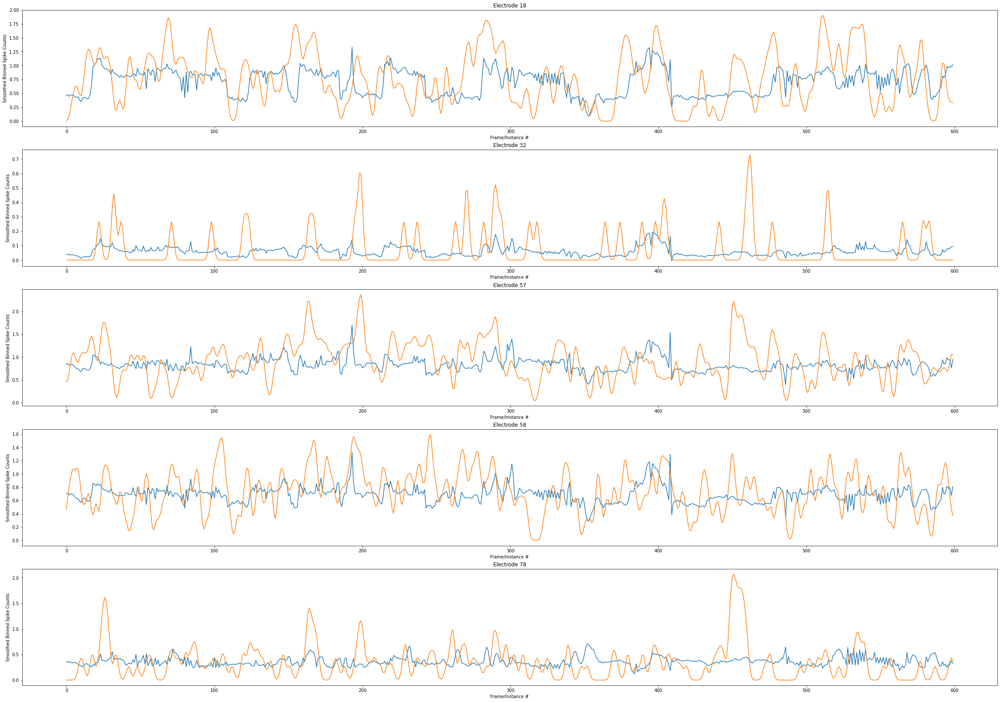

In [ ]:
for model, learning_rate in zip(linear_models_shuffled, [0.1,0.001,0.0001]):
    print('Learning Rate: {}'.format(learning_rate))
    with torch.no_grad():
        pred_good_section = model(torch.from_numpy(good_input_norm_20220309).float())
        output_good_section = torch.from_numpy(good_output_20220309).float()
        plot_targets_and_preds(pred_good_section, output_good_section, 600, electrodes_list = [18, 32, 57, 58, 78], fig_shape = (5,1))

### MLP

In [ ]:
def plot_losses_MLP(shuff, learning_rate, num_layers, numepochs = 301):
    date = '20220309'
    assert ((shuff == 'Shuffled') or (shuff == 'Not Shuffled'))
    if shuff == 'Shuffled':
        train_loader, test_loader, toy_loader = get_loaders(osim_dataset_20220309_shuff)
        train_mse_linreg_plot, test_mse_linreg_plot = train_mse_linreg_shuff, test_mse_linreg_shuff
        output_size = 96
    elif shuff == 'Not Shuffled':
        train_loader, test_loader, toy_loader = get_loaders(osim_dataset_20220309)
        train_mse_linreg_plot, test_mse_linreg_plot = train_mse_linreg, test_mse_linreg
        output_size = 96

    model = FCNet(input_dim=24, output_dim=output_size, num_layers=num_layers, hidden_layer_dim=112, add_relu = False)

    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.8, patience=8, min_lr=0.00005)
    total_params = sum(p.numel() for p in model.parameters())

    print('{}, full dataset'.format(model.name))
    print('Num Layers: {}, Hidden Layer Dimensionality: {}, Total Parameters: {}'\
        .format(model.num_layers, model.hidden_layer_dim, total_params))

    train_losses = []
    val_losses = []
    test_losses = []
    start = time.time()
    for epoch in range(numepochs):
        lr = scheduler.optimizer.param_groups[0]['lr']
        train_loss = train(train_loader, model, optimizer, criterion, scheduler)
        _, train_R2, train_preds, train_targets = test(train_loader, model, optimizer, criterion)
        test_loss, test_R2, test_preds, test_targets = test(test_loader, model, optimizer, criterion)
        scheduler.step(test_loss)
        if epoch % 50==0:
            print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:7f}, Test Loss: {:7f}. Train R2: {:.7f}, Test R2: {:.7f}'\
                  .format(epoch, lr, train_loss, test_loss, train_R2, test_R2))
        train_losses.append(train_loss)
        test_losses.append(test_loss)
    end = time.time()
    print('Time to train model: {}'.format(end-start))

    plt.plot(train_losses)
    plt.plot(test_losses)
    plt.title('Losses - Date: {}, Model: {}, Layers: {}'.format(date, model.name, model.num_layers))
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(['Train Losses', 'Test Losses'])
    plt.show()

    return(model)

Multi-Layer Perceptron, full dataset
Num Layers: 2, Hidden Layer Dimensionality: 112, Total Parameters: 13648
Epoch: 000, LR: 0.001000, Train Loss: 0.139581, Test Loss: 0.093976. Train R2: 0.2178400, Test R2: 0.2194487
Epoch: 050, LR: 0.001000, Train Loss: 0.080022, Test Loss: 0.080736. Train R2: 0.3438890, Test R2: 0.3289771
Epoch: 100, LR: 0.001000, Train Loss: 0.077666, Test Loss: 0.079421. Train R2: 0.3635770, Test R2: 0.3399942
Epoch: 150, LR: 0.001000, Train Loss: 0.076373, Test Loss: 0.078675. Train R2: 0.3747244, Test R2: 0.3462876
Epoch: 200, LR: 0.001000, Train Loss: 0.075511, Test Loss: 0.078111. Train R2: 0.3830744, Test R2: 0.3510265
Epoch: 250, LR: 0.001000, Train Loss: 0.074883, Test Loss: 0.077743. Train R2: 0.3894017, Test R2: 0.3541172
Epoch: 300, LR: 0.001000, Train Loss: 0.074444, Test Loss: 0.077561. Train R2: 0.3931635, Test R2: 0.3556519
Time to train model: 570.3184225559235


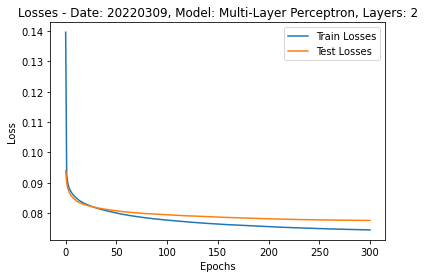

In [ ]:
model = plot_losses_MLP('Shuffled', 0.001, 2)

Learning Rate: 0.001


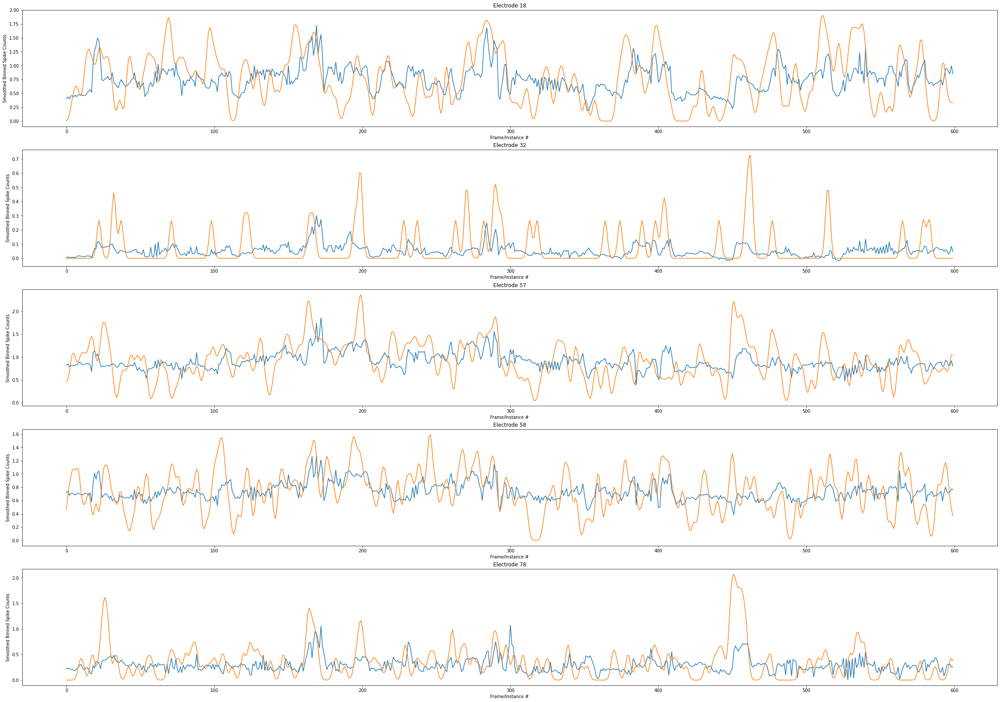

In [ ]:
print('Learning Rate: {}'.format(0.001))
with torch.no_grad():
    pred_good_section = model(torch.from_numpy(good_input_norm_20220309).float())
    output_good_section = torch.from_numpy(good_output_20220309).float()
    plot_targets_and_preds(pred_good_section, output_good_section, 600, electrodes_list = [18, 32, 57, 58, 78], fig_shape = (5,1))

Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26304
Epoch: 000, LR: 0.001000, Train Loss: 0.125018, Test Loss: 0.090774. Train R2: 0.2480177, Test R2: 0.2459720
Epoch: 050, LR: 0.001000, Train Loss: 0.073820, Test Loss: 0.076054. Train R2: 0.4016030, Test R2: 0.3681902
Epoch: 100, LR: 0.001000, Train Loss: 0.069530, Test Loss: 0.074768. Train R2: 0.4331628, Test R2: 0.3787870
Epoch: 150, LR: 0.000640, Train Loss: 0.066304, Test Loss: 0.074393. Train R2: 0.4542284, Test R2: 0.3817078
Epoch: 200, LR: 0.000328, Train Loss: 0.064473, Test Loss: 0.074051. Train R2: 0.4690126, Test R2: 0.3844487
Epoch: 250, LR: 0.000210, Train Loss: 0.063542, Test Loss: 0.073815. Train R2: 0.4772708, Test R2: 0.3863392
Epoch: 300, LR: 0.000086, Train Loss: 0.062895, Test Loss: 0.073317. Train R2: 0.4859102, Test R2: 0.3904443
Time to train model: 692.2986316680908


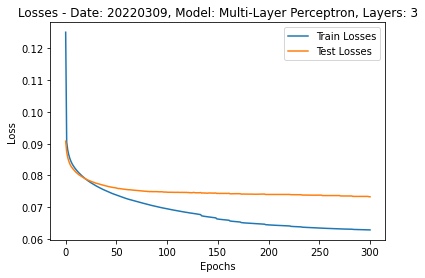

In [ ]:
mlp_3layers = plot_losses_MLP('Shuffled', 0.001, 3)

Learning Rate: 0.001


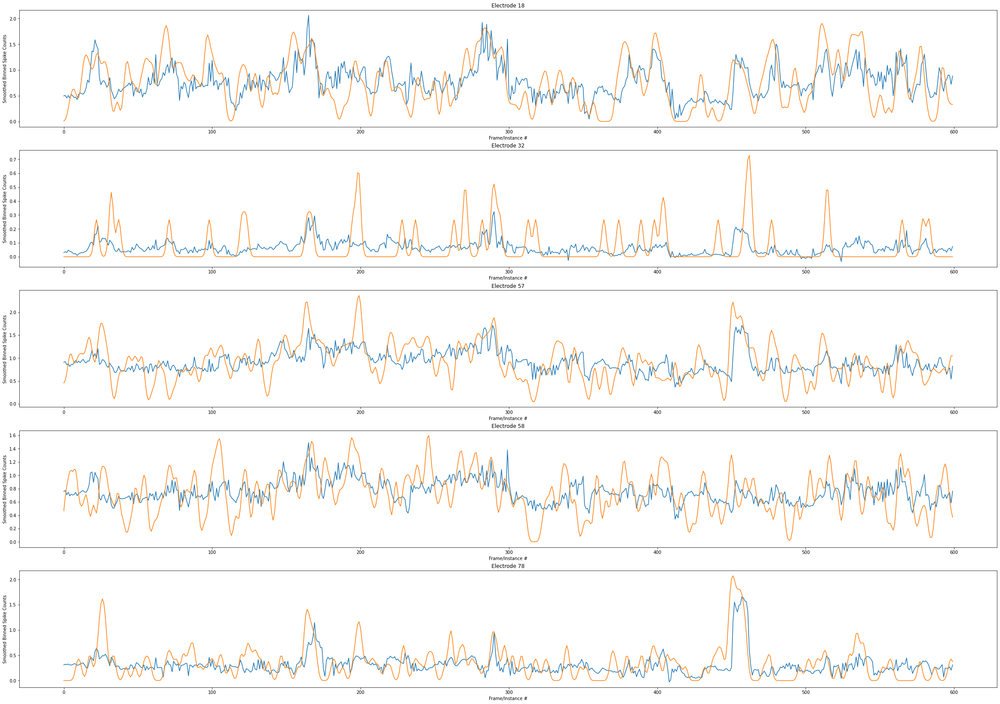

In [ ]:
print('Learning Rate: {}'.format(0.001))
with torch.no_grad():
    pred_good_section = mlp_3layers(torch.from_numpy(good_input_norm_20220309).float())
    output_good_section = torch.from_numpy(good_output_20220309).float()
    plot_targets_and_preds(pred_good_section, output_good_section, 600, electrodes_list = [18, 32, 57, 58, 78], fig_shape = (5,1))

# Temp CNN

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, shuffle = 'Shuffled', time_delay = False):
        self.date = '20220309'
        if time_delay == False:
            self.inputs = input_norm_20220309[:17900] #make dataset divisible by 100
            neuraldata = output_20220309[:17900] #make dataset divisible by 100
        else:
            self.inputs = input_norm_20220309[4:17904] #make dataset divisible by 100; shift by 4
            neuraldata = output_20220309[:17900] #make dataset divisible by 100
        # remove the "good" section for testing
        self.inputs = np.delete(self.inputs, np.arange(3000,3600), 0)
        neuraldata = np.delete(neuraldata, np.arange(3000,3600), 0)

        self.input_dim = self.inputs.shape[-1]
        self.num_neural_units = neuraldata.shape[1]
        self.neuraloutputs = neuraldata.reshape((-1, 100, self.num_neural_units), order = 'C') #I checked. We want order C
        self.sample_nums = np.arange(len(self.inputs)/100).astype(int)
        
        
        def shuffle_data(inputs, targets, samp_nums):
            assert len(inputs) == len(targets)
            p = np.random.permutation(len(inputs))
            return(inputs[p], targets[p], samp_nums[p])

        self.inputs = self.inputs.reshape((-1, 100, self.input_dim), order = 'C')

        if shuffle == 'Shuffled':
            self.inputs, self.neuraloutputs, self.sample_nums =\
             shuffle_data(self.inputs, self.neuraloutputs, self.sample_nums)

    def __len__(self):
        assert len(self.inputs) == len(self.neuraloutputs)
        return len(self.inputs)

    def __getitem__(self, idx):
        input = torch.from_numpy(self.inputs[idx])
        neuraloutput = torch.from_numpy(self.neuraloutputs[idx])
        return input.float().t(), neuraloutput.float(), self.sample_nums #input is transposed for convenience - better for Conv1D

In [ ]:
class TempConvNet(torch.nn.Module):
    def __init__(self, input_dim, output_dim, num_conv_layers, num_readout_layers, kernel_size, filters_per_conv, causal=False):
        super(TempConvNet, self).__init__()
        self.name = "Temporal CNN"
        self.net = nn.ModuleList()
        assert num_conv_layers >= 1
        self.num_conv_layers = num_conv_layers
        self.num_readout_layers = num_readout_layers
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.kernel_size = kernel_size
        self.causal = causal
        if self.causal == True:
            self.padding = kernel_size-1
        else:
            self.padding = 'same'
        
        # 1D convolutional layers
        for i in range(num_conv_layers):
            self.net.append(nn.Conv1d(in_channels = input_dim, out_channels = input_dim*filters_per_conv, \
                                      kernel_size = kernel_size, padding = self.padding))
            self.net.append(nn.ReLU())
            input_dim *= filters_per_conv

        # output layer
        self.net.append(nn.Linear(input_dim, output_dim))
        if num_readout_layers > 1:
            for i in range(num_readout_layers-1):
                self.net.append(nn.ReLU())
                self.net.append(nn.Linear(output_dim, output_dim))
    
    def forward(self, x):
        for i, layer in enumerate(self.net):
            shape_before = x.shape
            if (type(layer)==torch.nn.modules.linear.Linear) and (i==(len(self.net)-(2*self.num_readout_layers-1))):
                x = layer(torch.transpose(x, 1, 2))
            elif ((type(layer)==torch.nn.modules.conv.Conv1d) and (self.causal == True)):
                x = layer(x)
                x = x[:, :, :-layer.padding[0]]
            else:
                x = layer(x)
            shape_after = x.shape
        return(x)

In [ ]:
conv_osim_dataset_20220309_shuff = CustomDataset(shuffle = 'Shuffled')
conv_osim_dataset_20220309 = CustomDataset(shuffle = 'Not Shuffled')
conv_osim_dataset_20220309_shuff_td = CustomDataset(shuffle = 'Shuffled', time_delay=True)

In [ ]:
len(conv_osim_dataset_20220309_shuff)

173

In [ ]:
def plot_losses_TempCNN(shuff, time_delay, learning_rate, num_conv_layers, numepochs = 301):
    date = '20220309'
    assert ((shuff == 'Shuffled') or (shuff == 'Not Shuffled'))
    if shuff == 'Shuffled':
        if time_delay == False:
            train_loader, test_loader, toy_loader = get_loaders(conv_osim_dataset_20220309_shuff)
        else:
            train_loader, test_loader, toy_loader = get_loaders(conv_osim_dataset_20220309_shuff_td)
    elif shuff == 'Not Shuffled':
        train_loader, test_loader, toy_loader = get_loaders(conv_osim_dataset_20220309)
    output_size = 96

    model = TempConvNet(24, output_size, num_conv_layers, 1, 5, 2, causal=False)

    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.8, patience=8, min_lr=0.00005)
    total_params = sum(p.numel() for p in model.parameters())

    print('{}, full dataset'.format(model.name))
    print('Num Conv Layers: {}, Kernel Size: {}, Total Parameters: {}'\
        .format(model.num_conv_layers, model.kernel_size, total_params))

    train_losses = []
    val_losses = []
    test_losses = []
    start = time.time()
    for epoch in range(numepochs):
        lr = scheduler.optimizer.param_groups[0]['lr']
        train_loss = train(train_loader, model, optimizer, criterion, scheduler)
        _, train_R2, train_preds, train_targets = test(train_loader, model, optimizer, criterion, conv = True)
        test_loss, test_R2, test_preds, test_targets = test(test_loader, model, optimizer, criterion, conv = True)
        scheduler.step(test_loss)
        if epoch % 50==0:
            print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:7f}, Test Loss: {:7f}. Train R2: {:.7f}, Test R2: {:.7f}'\
                  .format(epoch, lr, train_loss, test_loss, train_R2, test_R2))
        train_losses.append(train_loss)
        test_losses.append(test_loss)
    end = time.time()
    print('Time to train model: {}'.format(end-start))

    plt.plot(train_losses)
    plt.plot(test_losses)
    plt.title('Losses - Date: {}, Model: {}, Conv Layers: {}'.format(date, model.name, model.num_conv_layers))
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(['Train Losses', 'Test Losses'])
    plt.show()

    return(model)

In [ ]:
def plot_targets_and_preds_cnn(model):
    print('Learning Rate: {}'.format(0.001))
    with torch.no_grad():
        inp = torch.from_numpy(good_input_norm_20220309.T).float().unsqueeze(0)
        pred_good_section = model(inp)
        output_good_section = torch.from_numpy(good_output_20220309).float()
        plot_targets_and_preds(pred_good_section.squeeze(), output_good_section, 600, electrodes_list = [18, 32, 57, 58, 78], fig_shape = (5,1))

Temporal CNN, full dataset
Num Conv Layers: 1, Kernel Size: 5, Total Parameters: 10512
Epoch: 000, LR: 0.001000, Train Loss: 0.675589, Test Loss: 0.599651. Train R2: -4.3115476, Test R2: -3.9754557
Epoch: 050, LR: 0.001000, Train Loss: 0.103670, Test Loss: 0.098331. Train R2: 0.1625921, Test R2: 0.0502976
Epoch: 100, LR: 0.001000, Train Loss: 0.094369, Test Loss: 0.094389. Train R2: 0.2371667, Test R2: 0.1213958
Epoch: 150, LR: 0.000512, Train Loss: 0.089838, Test Loss: 0.094210. Train R2: 0.2724560, Test R2: 0.1649728
Epoch: 200, LR: 0.000168, Train Loss: 0.088808, Test Loss: 0.094604. Train R2: 0.2803323, Test R2: 0.1722450
Epoch: 250, LR: 0.000050, Train Loss: 0.088531, Test Loss: 0.094722. Train R2: 0.2824225, Test R2: 0.1740929
Epoch: 300, LR: 0.000050, Train Loss: 0.088376, Test Loss: 0.094797. Train R2: 0.2836431, Test R2: 0.1751475
Time to train model: 40.72994804382324


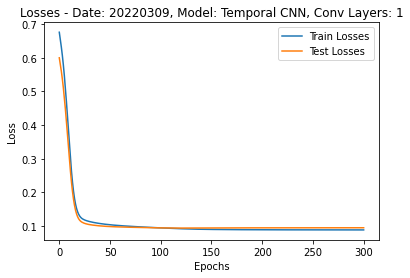

In [ ]:
cnn_1convlayers = plot_losses_TempCNN('Shuffled', False, 0.001, 1)

Learning Rate: 0.001


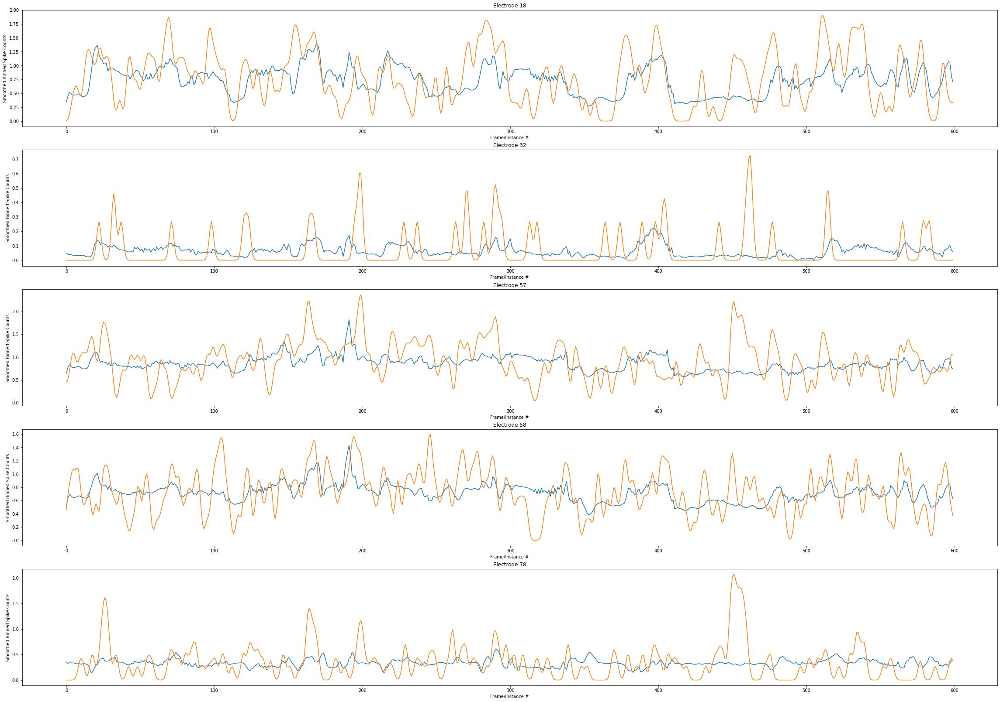

In [ ]:
plot_targets_and_preds_cnn(cnn_1convlayers)

Temporal CNN, full dataset
Num Conv Layers: 1, Kernel Size: 5, Total Parameters: 10512
Epoch: 000, LR: 0.001000, Train Loss: 0.673999, Test Loss: 0.601281. Train R2: -4.3204196, Test R2: -3.9908437
Epoch: 050, LR: 0.001000, Train Loss: 0.099297, Test Loss: 0.092869. Train R2: 0.1985824, Test R2: 0.1008516
Epoch: 100, LR: 0.001000, Train Loss: 0.087592, Test Loss: 0.086400. Train R2: 0.2940714, Test R2: 0.1894566
Epoch: 150, LR: 0.001000, Train Loss: 0.082739, Test Loss: 0.085564. Train R2: 0.3328586, Test R2: 0.2308188
Epoch: 200, LR: 0.000328, Train Loss: 0.081012, Test Loss: 0.085697. Train R2: 0.3459891, Test R2: 0.2400629
Epoch: 250, LR: 0.000086, Train Loss: 0.080558, Test Loss: 0.085742. Train R2: 0.3493826, Test R2: 0.2421978
Epoch: 300, LR: 0.000050, Train Loss: 0.080402, Test Loss: 0.085766. Train R2: 0.3505705, Test R2: 0.2429379
Time to train model: 34.47917175292969


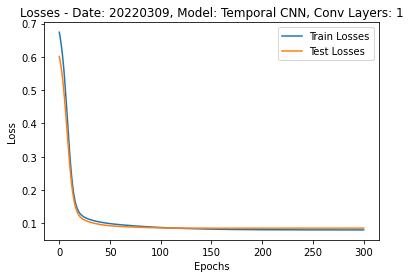

In [ ]:
cnn_1convlayers_td = plot_losses_TempCNN('Shuffled', True, 0.001, 1)

Learning Rate: 0.001


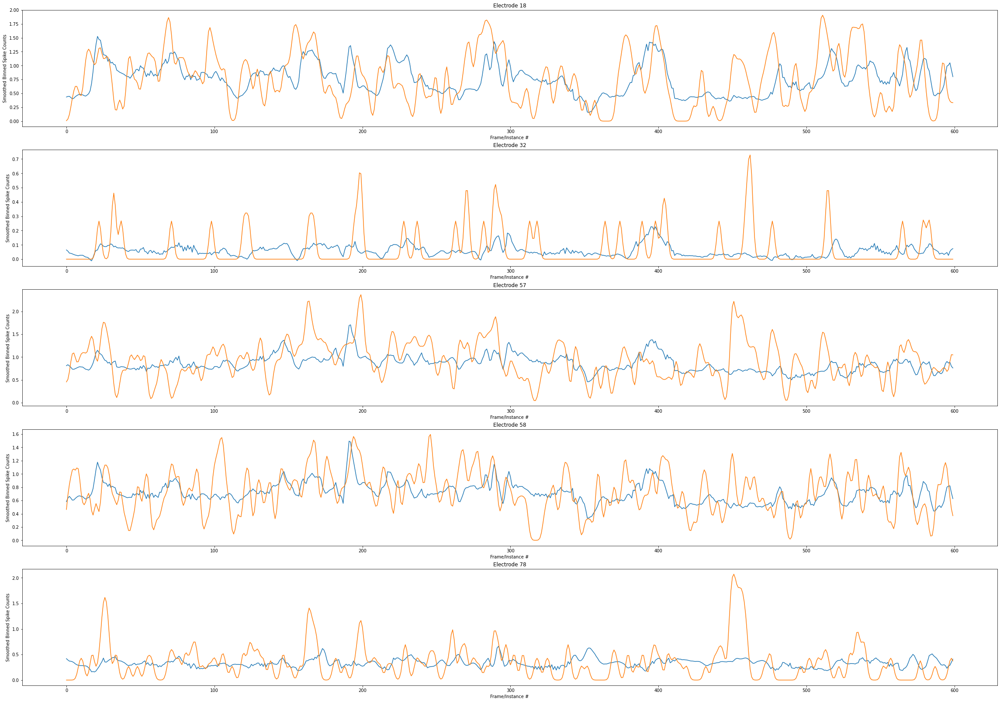

In [ ]:
plot_targets_and_preds_cnn(cnn_1convlayers_td)

Temporal CNN, full dataset
Num Conv Layers: 2, Kernel Size: 5, Total Parameters: 38256
Epoch: 000, LR: 0.001000, Train Loss: 0.657622, Test Loss: 0.574567. Train R2: -4.0823704, Test R2: -3.7608638
Epoch: 050, LR: 0.001000, Train Loss: 0.092214, Test Loss: 0.092601. Train R2: 0.2537837, Test R2: 0.1273753
Epoch: 100, LR: 0.001000, Train Loss: 0.079689, Test Loss: 0.083332. Train R2: 0.3519255, Test R2: 0.2457564
Epoch: 150, LR: 0.001000, Train Loss: 0.073301, Test Loss: 0.082138. Train R2: 0.4010940, Test R2: 0.2452148
Epoch: 200, LR: 0.000328, Train Loss: 0.070347, Test Loss: 0.082232. Train R2: 0.4228949, Test R2: 0.2444902
Epoch: 250, LR: 0.000107, Train Loss: 0.069598, Test Loss: 0.082254. Train R2: 0.4283725, Test R2: 0.2445222
Epoch: 300, LR: 0.000050, Train Loss: 0.069377, Test Loss: 0.082342. Train R2: 0.4300149, Test R2: 0.2442757
Time to train model: 65.3891077041626


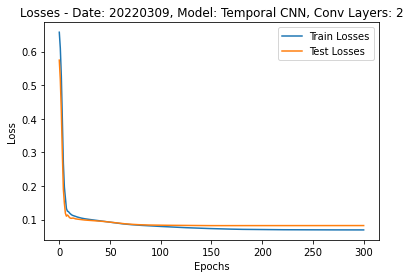

In [ ]:
cnn_2convlayers = plot_losses_TempCNN('Shuffled', False, 0.001, 2)

Learning Rate: 0.001


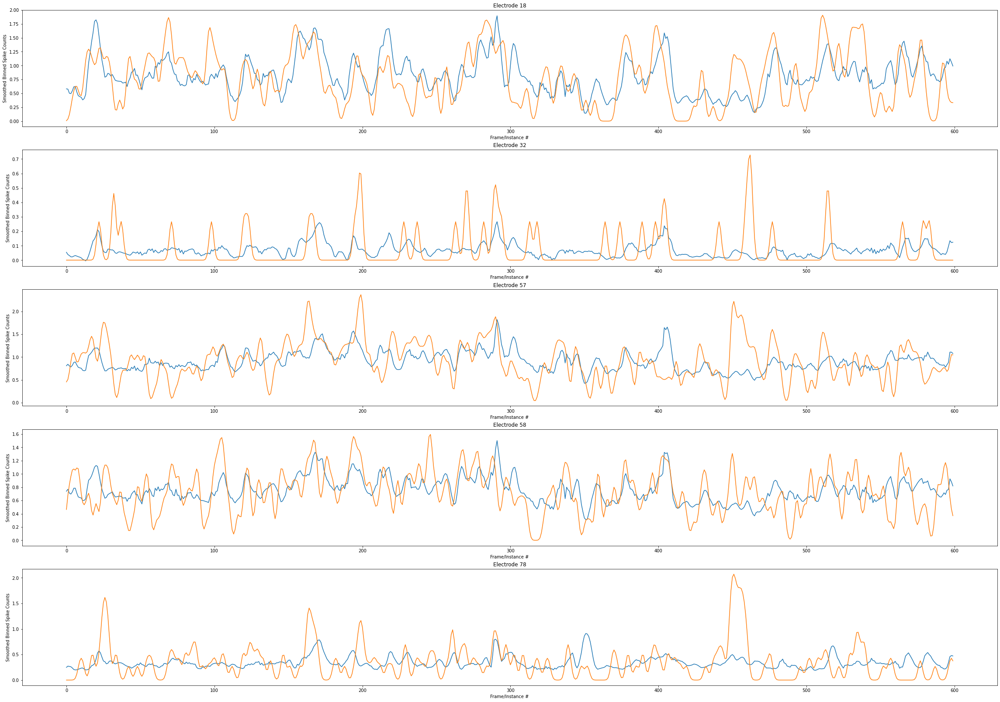

In [ ]:
plot_targets_and_preds_cnn(cnn_2convlayers)

Temporal CNN, full dataset
Num Conv Layers: 2, Kernel Size: 5, Total Parameters: 38256
Epoch: 000, LR: 0.001000, Train Loss: 0.666683, Test Loss: 0.583878. Train R2: -4.1653076, Test R2: -3.8219874
Epoch: 050, LR: 0.001000, Train Loss: 0.083736, Test Loss: 0.088166. Train R2: 0.3241691, Test R2: 0.2034688
Epoch: 100, LR: 0.001000, Train Loss: 0.072138, Test Loss: 0.083061. Train R2: 0.4134759, Test R2: 0.2836017
Epoch: 150, LR: 0.000512, Train Loss: 0.068432, Test Loss: 0.083321. Train R2: 0.4405831, Test R2: 0.2940215
Epoch: 200, LR: 0.000134, Train Loss: 0.067353, Test Loss: 0.083916. Train R2: 0.4481743, Test R2: 0.2960782
Epoch: 250, LR: 0.000050, Train Loss: 0.067036, Test Loss: 0.084198. Train R2: 0.4504468, Test R2: 0.2965657
Epoch: 300, LR: 0.000050, Train Loss: 0.066857, Test Loss: 0.084349. Train R2: 0.4518093, Test R2: 0.2969263
Time to train model: 66.69514513015747


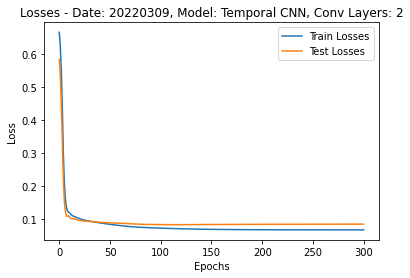

In [ ]:
cnn_2convlayers_td = plot_losses_TempCNN('Shuffled', True, 0.001, 2)

Learning Rate: 0.001


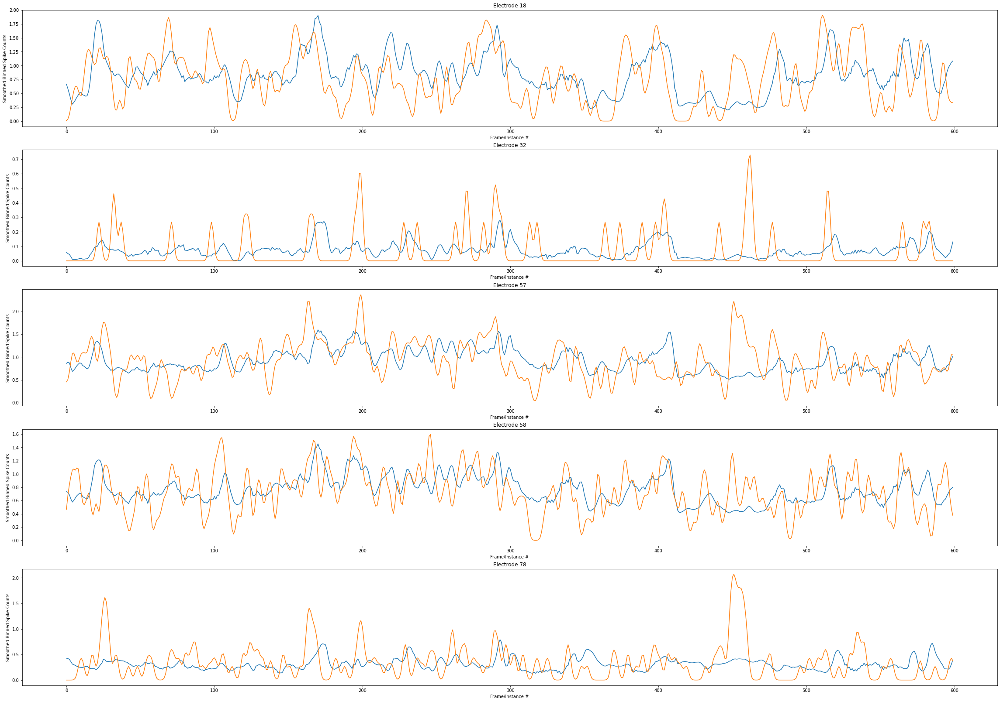

In [ ]:
plot_targets_and_preds_cnn(cnn_2convlayers_td)

Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 0.648972, Test Loss: 0.542441. Train R2: -3.7814110, Test R2: -3.4568216
Epoch: 050, LR: 0.001000, Train Loss: 0.080762, Test Loss: 0.085819. Train R2: 0.3454197, Test R2: 0.2388553
Epoch: 100, LR: 0.001000, Train Loss: 0.070172, Test Loss: 0.078711. Train R2: 0.4225521, Test R2: 0.2944999
Epoch: 150, LR: 0.000512, Train Loss: 0.064803, Test Loss: 0.078194. Train R2: 0.4670113, Test R2: 0.3029079
Epoch: 200, LR: 0.000328, Train Loss: 0.062530, Test Loss: 0.077806. Train R2: 0.4848171, Test R2: 0.3060440
Epoch: 250, LR: 0.000262, Train Loss: 0.061243, Test Loss: 0.076804. Train R2: 0.4948395, Test R2: 0.3093383
Epoch: 300, LR: 0.000262, Train Loss: 0.060212, Test Loss: 0.075783. Train R2: 0.5029559, Test R2: 0.3122134
Time to train model: 158.6316032409668


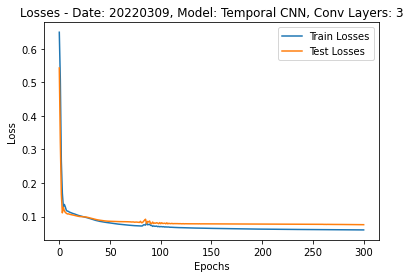

In [ ]:
cnn_3convlayers = plot_losses_TempCNN('Shuffled', False, 0.001, 3)

Learning Rate: 0.001


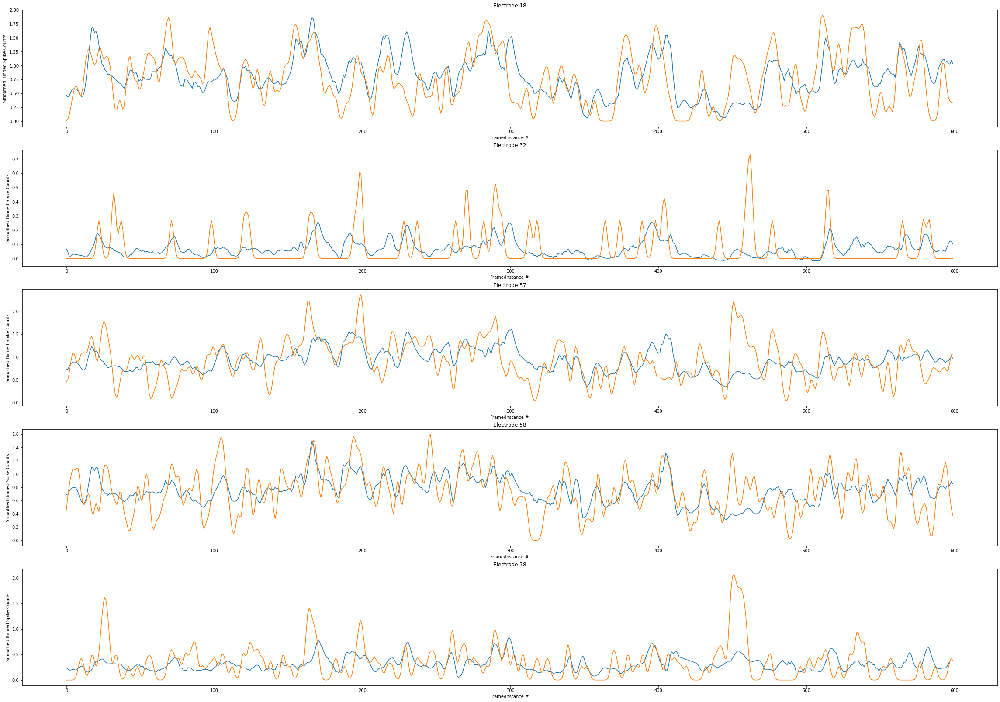

In [ ]:
plot_targets_and_preds_cnn(cnn_3convlayers)

Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 0.641653, Test Loss: 0.509273. Train R2: -3.5502763, Test R2: -3.2052539
Epoch: 050, LR: 0.001000, Train Loss: 0.079680, Test Loss: 0.088514. Train R2: 0.3538172, Test R2: 0.2525080
Epoch: 100, LR: 0.001000, Train Loss: 0.068527, Test Loss: 0.086053. Train R2: 0.4391603, Test R2: 0.2753278
Epoch: 150, LR: 0.000262, Train Loss: 0.064666, Test Loss: 0.084756. Train R2: 0.4685640, Test R2: 0.3004448
Epoch: 200, LR: 0.000069, Train Loss: 0.063806, Test Loss: 0.084572. Train R2: 0.4751423, Test R2: 0.3036208
Epoch: 250, LR: 0.000050, Train Loss: 0.063495, Test Loss: 0.084642. Train R2: 0.4776026, Test R2: 0.3047548
Epoch: 300, LR: 0.000050, Train Loss: 0.063197, Test Loss: 0.084657. Train R2: 0.4799913, Test R2: 0.3060160
Time to train model: 156.9120433330536


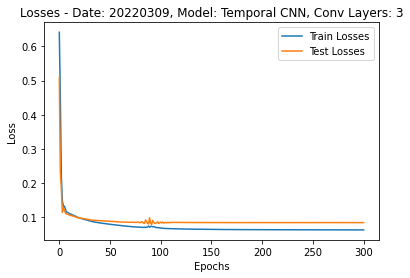

In [ ]:
cnn_3convlayers_td = plot_losses_TempCNN('Shuffled', True, 0.001, 3)

Learning Rate: 0.001


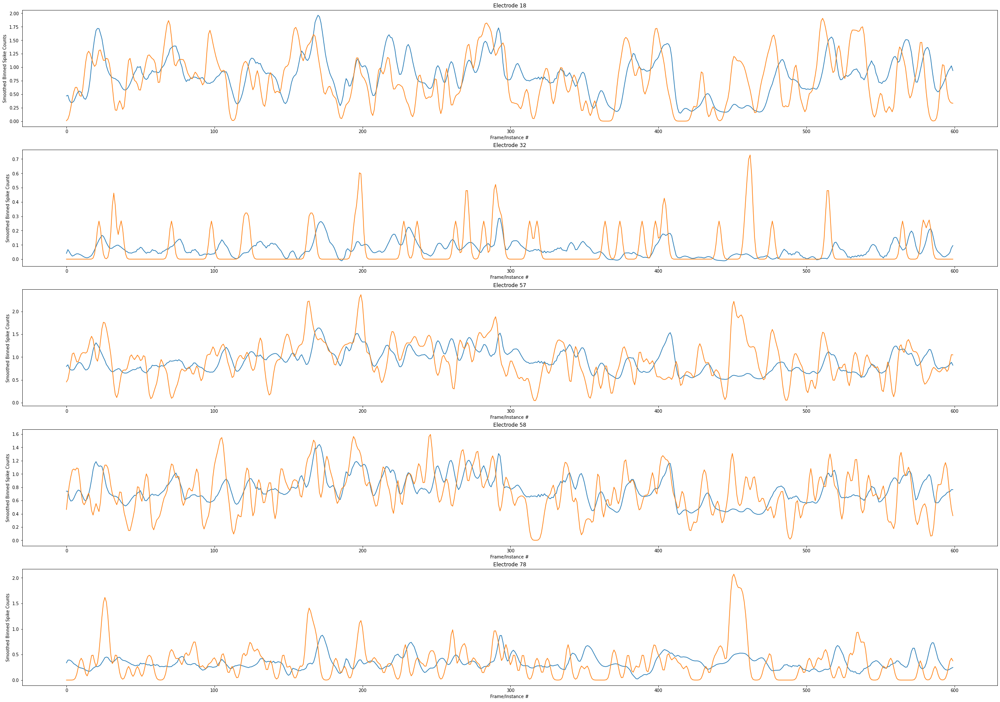

In [ ]:
plot_targets_and_preds_cnn(cnn_3convlayers_td)